In [ ]:
!pip install pandas matplotlib wandb numpy

In [3]:
save_plots_dir = #add your path here
wandb_user = #add wandb user her

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import wandb
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

In [5]:


def wandb_viz_loss_with_std(exp_data, norm_factor=1, y_lim=None, figsize=(10, 6), make_legend=None, legend_font=14, starting_color=0, starting_style=0, color_by_loss_type = False, style_by_loss_type=True, plot_name=None, plot_std=True, loss_types=None, save_dir=None, exclude=None, wandb_user=wandb_user, 
                            wandb_project='structure-preserving-operator-learning', losses=None, vars=None, title=None, x_label=True, y_label=True):
    """
    exp_data: list of tuples [(label, [exp_id1, exp_id2, ...]), ...] containing labels and their experiment IDs
    """
    wandb.login()
    fig, ax1 = plt.subplots(figsize=figsize, dpi=300)
    ax2 = None
    
    colors = plt.cm.tab10(np.linspace(0, 1, 10))
    styles = ['-', '--', ':', '-.', '-', '--', ':', '-.']
    alphas = [1.0, 1.0]
    
    api = wandb.Api(timeout=29)
    all_losses = set()
    
    # Collect all loss types
    for _, exp_ids in exp_data:
        exp_ids = [exp_ids] if isinstance(exp_ids, str) else exp_ids
        for exp_n in exp_ids:
            run = api.run(f"{wandb_user}/{wandb_project}/{exp_n}")
            if losses is None:
                all_losses.update([k for k in run.history().keys() if 'MSE' in k])
    
    losses = sorted(list(all_losses)) if losses is None else losses
    
    # Plot experiments
    for idx, (label, exp_ids) in enumerate(exp_data):
        exp_ids = [exp_ids] if isinstance(exp_ids, str) else exp_ids

        if not color_by_loss_type:
            base_color = colors[idx+starting_color]

        if not style_by_loss_type:
            style = styles[idx+starting_style]
        
        for idx, loss in enumerate(loss_types.keys()):
            if exclude is not None and any(loss in ex for ex in exclude):
                continue

            if color_by_loss_type:
                base_color = colors[idx+starting_color]

            if style_by_loss_type:
                style = styles[idx+starting_style]
                
            # style = styles[1] if 'val' in loss else styles[0]
            alpha = alphas[1] if 'val' in loss else alphas[0]
            
            # Collect data from all experiments
            all_data = []
            max_epoch = 0
            for exp_n in exp_ids:
                run = api.run(f"{wandb_user}/{wandb_project}/{exp_n}")
                metrics = run.history()
                iteration = metrics['epoch']
                loss_data = metrics[loss]/norm_factor
                valid_data = [(i, l) for i, l in zip(iteration, loss_data) if not pd.isna(l)]
                if valid_data:
                    x, y = zip(*valid_data)
                    all_data.append((x, y))
                    max_epoch = max(max_epoch, max(x))
            
            if not all_data:
                continue
            

            # Interpolate to common x-axis
            common_x = np.linspace(0, max_epoch, 1000)
            interpolated_y = []
            
            for x, y in all_data:
                interpolated_y.append(np.interp(common_x, x, y))
            
            mean_y = np.mean(interpolated_y, axis=0)
            std_y = np.std(interpolated_y, axis=0)
            
            ax = ax2 if vars and loss in vars else ax1
            if y_lim is not None:
                ax.set_ylim(y_lim[0], y_lim[1])
            if ax2 is None and vars and loss in vars:
                ax2 = ax1.twinx()
                ax2.set_ylabel("Secondary Loss Metric", fontsize=legend_font)
                if y_lim is not None:
                    ax2.set_ylim(y_lim[0], y_lim[1])

            if len(exp_data)>1:
                prefix = f'{label} - '
            else:
                prefix = ''
            
            ax.plot(common_x, mean_y, label=f"{prefix}{loss_types[loss] if loss_types else loss}", 
                    linestyle=style, color=base_color, alpha=alpha, linewidth=2)
            if plot_std:
                ax.fill_between(common_x, mean_y-std_y, mean_y+std_y, color=base_color, alpha=0.2)

    # Rest of the styling remains the same as in original function
    if x_label:
        ax1.set_xlabel("Epoch", fontsize=legend_font)
    # if y_label:
    #     ax1.set_ylabel("Loss (log)", fontsize=22)
    if title:
        ax1.set_title(title, fontsize=legend_font, pad=20)
    ax1.grid(True, linestyle='--', alpha=0.7)
    ax1.set_yscale('log')
    for spine in ax1.spines.values():
        spine.set_linewidth(1.5)
    
        
    std = 'with_std' if plot_std else 'without_std'

    ax1.tick_params(axis='both', labelsize=20)
    if ax2:
        ax2.tick_params(axis='both', labelsize=20)
    

    if plot_name is None:
        plot_name = exp_data[0][0]

    if save_dir:
        plt.savefig(f"{save_dir}/loss_curves_{std}_{plot_name}.png", dpi=300, bbox_inches="tight")
    else:
        plt.show()
    
    plt.close()

In [6]:
def wandb_final_loss_with_std(exp_data, train_loss=None, val_loss=None, test_loss=None, loss_types=None, save_dir=None, exclude=None, wandb_user=wandb_user, 
                            wandb_project='structure-preserving-operator-learning', losses=None, vars=None):
    """
    Prints a table of averaged final losses and their standard deviations for each loss type.
    
    Args:
        exp_data: list of tuples [(label, [exp_id1, exp_id2, ...]), ...]
        loss_types: dict mapping loss variable names (in wandb) to display names
    """
    wandb.login()
    api = wandb.Api(timeout=29)

    if loss_types is None:
        raise ValueError("loss_types must be provided and map wandb variable names to display labels.")

    table_rows = []

    for label, exp_ids in exp_data:
        exp_ids = [exp_ids] if isinstance(exp_ids, str) else exp_ids
        row = {'Label': label}

        # Find and record the best validation loss if specified
        if val_loss:
            best_epochs = []
            for exp_id in exp_ids:
                try:
                    run = api.run(f"{wandb_user}/{wandb_project}/{exp_id}")
                    history = run.history(keys=[val_loss, train_loss] if train_loss else [val_loss])
                    val_values = history[val_loss].dropna().values
                    if len(val_values) > 0:
                        best_epoch = val_values.argmin()
                    
                    if train_loss:
                        train_values = history[train_loss].dropna().values
                        if len(train_values) > best_epoch:
                            train_at_best = train_values[best_epoch]
                    best_epochs.append(train_at_best)
                    
                except Exception as e:
                    print(f"Skipping run {exp_id} for validation loss due to error: {e}")
                    
        for loss_var, display_name in loss_types.items():
            final_losses = []
            
            for exp_id in exp_ids:
                try:
                    run = api.run(f"{wandb_user}/{wandb_project}/{exp_id}")
                    history = run.history(keys=[loss_var])
                    values = history[loss_var].dropna().values
                    if len(values) > 0:
                        final_losses.append(values[-1])
                except Exception as e:
                    print(f"Skipping run {exp_id} due to error: {e}")
            


            if final_losses:
                mean_loss = np.mean(final_losses)
                std_loss = np.std(final_losses)
                row[f"{display_name}"] = f"{mean_loss:.12f} ± {std_loss:.12f}"
            else:
                row[f"{display_name}"] = "N/A"

            if final_losses and val_loss and test_loss:
                if loss_var == test_loss:
                    gen_error = np.abs(final_losses - train_at_best)
                    mean_loss = np.mean(gen_error)
                    std_loss = np.std(gen_error)
                    row[f"{display_name}-gen_error"] = f"{mean_loss:.12f} ± {std_loss:.12f}"
                
            if loss_var == val_loss:
                rel_train_val_diffs = []
                for exp_id in exp_ids:
                    try:
                        run = api.run(f"{wandb_user}/{wandb_project}/{exp_id}")
                        history = run.history(keys=[train_loss, val_loss])
                        train_values = history[train_loss].dropna().values
                        val_values = history[val_loss].dropna().values
                        min_len = min(len(train_values), len(val_values))
                        if min_len > 0:
                            rel_diff = np.mean(np.abs(val_values[:min_len] - train_values[:min_len])/train_values[:min_len])
                            rel_train_val_diffs.append(rel_diff)
                    except Exception as e:
                        print(f"Skipping run {exp_id} for train-val difference due to error: {e}")

                if rel_train_val_diffs:
                    mean_diff = np.mean(rel_train_val_diffs)
                    std_diff = np.std(rel_train_val_diffs)
                    row["train-val difference"] = f"{mean_diff:.12f} ± {std_diff:.12f}"
                else:
                    row["train-val difference"] = "N/A"
        table_rows.append(row)

    df = pd.DataFrame(table_rows)
    print(df.to_string(index=False))
    
    if save_dir:
        df.to_csv(f"{save_dir}/final_loss_summary_{exp_data[0][0]}.csv", index=False)

In [7]:
import pickle
import torch
from itertools import cycle
import os

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import wandb
import pandas as pd
from matplotlib.ticker import MaxNLocator, LogLocator

def wandb_viz_loss_with_std(
    exp_data,
    norm_factor = 1,
    y_lim=None,
    figsize=(10, 6),
    dpi=300,
    make_legend=False,
    legend_font=14,
    starting_color=0,
    starting_style=0,
    color_by_loss_type=False,
    style_by_loss_type=True,
    plot_name=None,
    plot_std=True,
    loss_types=None,
    save_dir=None,
    exclude=None,
    wandb_user=wandb_user,
    wandb_project='structure-preserving-operator-learning',
    losses=None,
    vars=None,
    title=None,
    x_label=True,
    y_label=True
):
    """
    exp_data: list of tuples [(label, [exp_id1, exp_id2, ...]), ...]
    loss_types: dict mapping loss key -> display name
    vars: list of loss keys to plot on secondary y-axis
    """
    # Set default tick label sizes
    # plt.rcParams.update({'xtick.labelsize': 20, 'ytick.labelsize': 20})

    # Login and prepare figure
    wandb.login()
    fig, ax1 = plt.subplots(figsize=figsize, dpi=dpi)
    ax2 = None

    # Color and style pools
    colors = plt.cm.tab10(np.linspace(0, 1, 10))
    styles = ['-', '--', ':', '-.'] * 2

    # Initialize API
    api = wandb.Api(timeout=60)

    # Determine loss metrics if not provided
    if losses is None:
        all_losses = set()
        for _, ids in exp_data:
            ids = [ids] if isinstance(ids, str) else ids
            for run_id in ids:
                history = api.run(f"{wandb_user}/{wandb_project}/{run_id}").history()
                all_losses.update([k for k in history.keys() if 'MSE' in k])
        losses = sorted(all_losses)

    # Main loop to plot each loss
    for exp_idx, (label, ids) in enumerate(exp_data):
        ids = [ids] if isinstance(ids, str) else ids
        base_color = colors[(exp_idx + starting_color) % len(colors)]
        base_style = styles[(exp_idx + starting_style) % len(styles)]

        for loss_idx, loss_key in enumerate(loss_types or losses):
            if exclude and any(exc in loss_key for exc in exclude):
                continue

            # Choose color/style
            color = colors[(loss_idx + starting_color) % len(colors)] if color_by_loss_type else base_color
            style = styles[(loss_idx + starting_style) % len(styles)] if style_by_loss_type else base_style
            alpha = 0.8 if 'val' in loss_key else 1.0

            # Gather run data
            all_runs, max_epoch = [], 0
            for run_id in ids:
                hist = api.run(f"{wandb_user}/{wandb_project}/{run_id}").history()
                epochs = hist['epoch']
                vals = hist.get(loss_key)/norm_factor
                pairs = [(e, v) for e, v in zip(epochs, vals) if not pd.isna(v)]
                if pairs:
                    x_vals, y_vals = zip(*pairs)
                    all_runs.append((x_vals, y_vals))
                    max_epoch = max(max_epoch, max(x_vals))

            if not all_runs:
                continue

            # Secondary axis if needed
            needs_secondary = vars and loss_key in vars
            if needs_secondary and ax2 is None:
                ax2 = ax1.twinx()
                ax2.set_ylabel('Secondary Loss Metric', fontsize=22)

            ax = ax2 if needs_secondary else ax1
            if y_lim:
                ax.set_ylim(*y_lim)

            # Plot single vs multiple runs
            if len(all_runs) == 1:
                x_plot, y_plot = all_runs[0]
                ax.plot(x_plot, y_plot,
                        label=f"{label} - {loss_types.get(loss_key, loss_key)}",
                        linestyle=style, color=color, alpha=alpha, linewidth=2)
            else:
                common_x = np.linspace(0, max_epoch, 1000)
                interp = [np.interp(common_x, x, y) for x, y in all_runs]
                mean_y = np.mean(interp, axis=0)
                std_y = np.std(interp, axis=0)
                ax.plot(common_x, mean_y,
                        label=f"{label} - {loss_types.get(loss_key, loss_key)}",
                        linestyle=style, color=color, alpha=alpha, linewidth=2)
                if plot_std:
                    ax.fill_between(common_x, mean_y - std_y, mean_y + std_y,
                                    color=color, alpha=0.2)

    # Final styling
    if x_label:
        ax1.set_xlabel('Epoch', fontsize=legend_font)
    if y_label:
        ax1.set_ylabel('Loss (log)', fontsize=legend_font)
    if title:
        ax1.set_title(title, fontsize=legend_font, pad=15)

        # Log scale
    ax1.set_yscale('log')
    
    # Enable grid lines on both axes for major ticks
    # ax1.grid(which='major', axis='both', linestyle='--', alpha=0.7)
    
    # # Optionally enable minor grid lines for more finely spaced y-grids
    # # ax1.min/orticks_on()
    # ax1.grid(which='major', axis='y', linestyle='--', alpha=0.3)


    # Set tick locators for regular intervals
    # X-axis: integer epochs, max 10 ticks
    ax1.xaxis.set_major_locator(MaxNLocator(nbins=10, integer=True))
    # Y-axis: decades on log scale
    ax1.yaxis.set_major_locator(LogLocator(base=10.0, numticks=6))

    # Secondary axis ticks
    if ax2 is not None:
        ax2.yaxis.set_major_locator(MaxNLocator(nbins=6))

    # Apply tick style
    tick_kwargs = dict(which='major', labelsize=legend_font, length=8, width=2)
    ax1.tick_params(axis='both', **tick_kwargs)
    if ax2 is not None:
        ax2.tick_params(axis='y', **tick_kwargs)

    
    ax1.grid(True, linestyle='--', alpha=0.7)


    # Adjust layout
    # fig.tight_layout()

    # Legend
    if make_legend:
        axes = [ax1] + ([ax2] if ax2 is not None else [])
        lines, labels = [], []
        for a in axes:
            l, lab = a.get_legend_handles_labels()
            lines += l; labels += lab
        ax1.legend(lines, labels, fontsize=legend_font,
                   loc='upper right', bbox_to_anchor=(0.98, 0.98), frameon=True)

    # Save or show
    plot_id = plot_name or exp_data[0][0]
    if save_dir:
        plt.savefig(f"{save_dir}/loss_curves_{plot_id}.png", dpi=dpi, bbox_inches='tight')
    else:
        plt.show()

    plt.close(fig)


In [9]:

def plot_1d_wave_evolution(data_path, save_dir, i, suffix, exp_label, factor=5, title=True, x_label=True, y_label=True, colorbar=True, v_min=None, v_max=None, diff_min=None, diff_max=None, nrg_ylim=None, total_nrg_ylim=None, fontsize=12, make_legend=True):
    
    plt.rcParams.update({'xtick.labelsize': fontsize, 'ytick.labelsize': fontsize})


    kwargs = {}
    diff_kwargs = {}
    if v_min is not None:
        kwargs['vmin'] = v_min
    if v_max is not None:
        kwargs['vmax'] = v_max
    if diff_min is not None:
        diff_kwargs['vmin'] = diff_min
    if diff_max is not None:
        diff_kwargs['vmax'] = diff_max
    
    with open(data_path, 'rb') as f:
        data = pickle.load(f)
        args = data.get('args')
        gt_u = torch.tensor(data.get('gt_u')) if data.get('gt_u') is not None else None
        gt_ut = torch.tensor(data.get('gt_ut')) if data.get('gt_ut') is not None else None
        x = torch.tensor(data.get('x')) if data.get('x') is not None else None
        output = torch.tensor(data.get('output')) if data.get('output') is not None else None
        outputt = torch.tensor(data.get('outputt')) if data.get('outputt') is not None else None
        example_t = torch.tensor(data.get('example_t')) if data.get('example_t') is not None else None
        true_energy = torch.tensor(data.get('true_energy')) if data.get('true_energy') is not None else None

        example_t = example_t * factor

        # Handle optional components that might be None
        current_energy = torch.tensor(data.get('current_energy')) if data.get('current_energy') is not None else None
        learned_energy = torch.tensor(data.get('learned_energy')) if data.get('learned_energy') is not None else None

        # Convert energy components dictionary values to tensors, preserving None values
        energy_components = {k: torch.tensor(v) if v is not None else None 
                            for k, v in data.get('energy_components', {}).items()}

    num_t = args.Nt

    #heatmap u ground truth
    plt.figure(figsize=(8, 5))
    plt.imshow(gt_u, aspect='auto', extent=[args.xmin, args.xmax, args.tmin, args.tmax], cmap='viridis', **kwargs)
    # if colorbar:gridspec
    plt.colorbar()
    if x_label:
        plt.xlabel('x', fontsize=fontsize)
    if y_label:
        plt.ylabel('t', fontsize=fontsize)
    if title:
        plt.title('$u$ Ground Truth', fontsize=fontsize)
    if save_dir:
        plt.savefig(f"{save_dir}/1d_wave_truth_{i}_{suffix}.png", dpi=300, bbox_inches="tight")
    else:
        plt.show()

    #heatmap u evolution
    plt.figure(figsize=(8, 5))
    plt.imshow(output, aspect='auto', extent=[args.xmin, args.xmax, args.tmin, args.tmax], cmap='viridis', **kwargs)
    if colorbar:
        plt.colorbar()
    if x_label:
        plt.xlabel('x', fontsize=fontsize)
    if y_label:
        plt.ylabel('t', fontsize=fontsize)
    if title:
        plt.title('$u$ Predicted', fontsize=fontsize)
    if save_dir:
        plt.savefig(f"{save_dir}/1d_wave_preds_{i}_{suffix}.png", dpi=300, bbox_inches="tight")
    else:
        plt.show()

    #heatmap ut ground truth (if dos)
    if args.num_output_fn == 2:
        plt.figure(figsize=(8, 5))
        plt.imshow(gt_ut, aspect='auto', extent=[args.xmin, args.xmax, args.tmin, args.tmax], cmap='viridis', **kwargs)
        # if colorbar:
        plt.colorbar()
        plt.xlabel('x', fontsize=fontsize)
        plt.ylabel('t', fontsize=fontsize)
        if title:
            plt.title('$u_t$ Ground Truth', fontsize=fontsize)
        if save_dir:
            plt.savefig(f"{save_dir}/1d_wave_dt_ground_truth_{i}_{suffix}.png", dpi=300, bbox_inches="tight")
        else:
            plt.show()

    #heatmap ut evolution (if dos)
    if args.num_output_fn == 2:
        plt.figure(figsize=(8, 5))
        plt.imshow(outputt, aspect='auto', extent=[args.xmin, args.xmax, args.tmin, args.tmax], cmap='viridis', **kwargs)
        if colorbar:
            plt.colorbar()
        if x_label:
            plt.xlabel('x', fontsize=fontsize)
        if y_label:
            plt.ylabel('t', fontsize=fontsize)
        if title:
            plt.title('$u_t$ Predicted', fontsize=fontsize)
        if save_dir:
            plt.savefig(f"{save_dir}/1d_wave_dt_preds_{i}_{suffix}.png", dpi=300, bbox_inches="tight")
        else:
            plt.show()
    
        
    #heatmap u evolution difference
    plt.figure(figsize=(8, 5))
    plt.imshow(abs(output-gt_u), aspect='auto', extent=[args.xmin, args.xmax, args.tmin, args.tmax], cmap='viridis', **diff_kwargs)
    if colorbar:
        plt.colorbar()
    if x_label:
        plt.xlabel('x', fontsize=fontsize)
    if y_label:
        plt.ylabel('t', fontsize=fontsize)
    if title:   
        plt.title('$u$ Absolute Error', fontsize=fontsize)
    if save_dir:
        plt.savefig(f"{save_dir}/1d_wave_diff_{i}_{suffix}.png", dpi=300, bbox_inches="tight")
    else:
        plt.show()

    #heatmap ut evolution difference (if dos)
    if args.num_output_fn == 2:
        plt.figure(figsize=(8, 5))
        plt.imshow(abs(outputt-gt_ut), aspect='auto', extent=[args.xmin, args.xmax, args.tmin, args.tmax], cmap='viridis', **diff_kwargs)
        if colorbar:
            plt.colorbar()
        if x_label:
            plt.xlabel('x', fontsize=fontsize)
        if y_label:
            plt.ylabel('t', fontsize=fontsize)
        if title:
            plt.title('$u_t$ Absolute Error', fontsize=fontsize)
        if save_dir:
            plt.savefig(f"{save_dir}/1d_wave_dt_diff_{i}_{suffix}.png", dpi=300, bbox_inches="tight")
        else:
            plt.show()

    #slices u evolution
    x = np.linspace(-args.xmin, args.xmin, args.Nx, endpoint=False)
    plt.figure(figsize=(8, 8))
    
    # Use a colorblind-friendly palette
    color_cycle = cycle(plt.rcParams['axes.prop_cycle'].by_key()['color'])
    num_slices = 3

    plt.rcParams.update({'xtick.labelsize': fontsize + 6, 'ytick.labelsize': fontsize +4})

    
    for k, t in enumerate(range(0, num_t, num_t//num_slices)):
        if k >= num_slices:
            break
        color = next(color_cycle)
        plt.plot(x, gt_u[t], 
                label=f't={k * (5 / (num_slices-1)):.1f} G.T.', 
                color=color)
        plt.plot(x, output[t], 
                label=f't={k * (5 / (num_slices-1))} Pred.', 
                color=color, 
                linestyle='dashed')
    if x_label:
        plt.xlabel('x', fontsize=fontsize + 6)
    if y_label:
        plt.ylabel('u', fontsize=fontsize + 6)
    if title:
        plt.title('Time Slices Prediction vs Ground Truth', fontsize=fontsize + 6)
    if make_legend:
        plt.legend(fontsize=fontsize)
    if save_dir:
        plt.savefig(f"{save_dir}/1d_wave_slices_{i}_{suffix}.png", dpi=300, bbox_inches="tight")
    else:
        plt.show()

    plt.rcParams.update({'xtick.labelsize': fontsize, 'ytick.labelsize': fontsize})


    # Make tall enough figure for space below
    fig = plt.figure(figsize=(20, 6))

    fig.subplots_adjust(
    left=0.07,   # space for y-labels
    right=0.97,  # space for colorbars if needed
    top=0.90,    # space for titles
    bottom=0.2 if make_legend else -0.2,  # space for x-labels and legend below
    wspace=0.3,  # space between plots
    hspace=0.4 if make_legend else -0.1  # space between rows (if 2-row GridSpec)
    )


    # Create a 2-row GridSpec: one for plots, one for colorbars + legend
    # if make_legend:
    gs = GridSpec(2, 3, height_ratios=[12, 1], width_ratios=[1.2, 1.2, 1.5], hspace=0.4)
    # else:
    #     gs = GridSpec(1, 3, width_ratios=[1.2, 1.2, 1.5], hspace=0.4)

    # Subplot row (top)
    axs = [fig.add_subplot(gs[0, i]) for i in range(3)]

    # --- Plot 1: u prediction ---
    im0 = axs[0].imshow(output, aspect='auto', extent=[args.xmin, args.xmax, args.tmin, args.tmax],
                        cmap='viridis', **kwargs)
    if title:
        axs[0].set_title('$u$ Predicted', fontsize=fontsize)
    if x_label:
        axs[0].set_xlabel('x', fontsize=fontsize)
    if y_label:
        axs[0].set_ylabel('t', fontsize=fontsize)

    # --- Plot 2: u absolute error ---
    abs_u_error = abs(output - gt_u)
    im1 = axs[1].imshow(abs_u_error, aspect='auto', extent=[args.xmin, args.xmax, args.tmin, args.tmax],
                        cmap='viridis', **diff_kwargs)
    if title:
        axs[1].set_title('$u$ Absolute Error', fontsize=fontsize)
    if x_label:
        axs[1].set_xlabel('x', fontsize=fontsize)

    # --- Plot 3: time slices ---
    x = np.linspace(-args.xmin, args.xmin, args.Nx, endpoint=False)
    color_cycle = cycle(plt.rcParams['axes.prop_cycle'].by_key()['color'])
    num_slices = 3
    for k, t in enumerate(range(0, num_t, num_t // num_slices)):
        if k >= num_slices:
            break
        color = next(color_cycle)
        axs[2].plot(x, gt_u[t], label=f't={k * (5 / (num_slices - 1)):.1f} G.T.', color=color)
        axs[2].plot(x, output[t], label=f't={k * (5 / (num_slices - 1)):.1f} Pred.', color=color, linestyle='dashed')
    if title:
        axs[2].set_title('Time Slices Prediction vs G.T.', fontsize=fontsize)
    if x_label:
        axs[2].set_xlabel('x', fontsize=fontsize)
    if y_label:
        axs[2].set_ylabel('u', fontsize=fontsize)

    # --- Bottom row for colorbars and legend ---
    # Colorbar for plot 1
    if make_legend:
        cax0 = fig.add_subplot(gs[1, 0])
        cbar0 = fig.colorbar(im0, cax=cax0, orientation='horizontal')
        cbar0.set_label('$u$ value', fontsize=fontsize)

    # Colorbar for plot 2
    if make_legend:
        cax1 = fig.add_subplot(gs[1, 1])
        cbar1 = fig.colorbar(im1, cax=cax1, orientation='horizontal')
        cbar1.set_label('Absolute Error', fontsize=fontsize)

    # Legend below plot 3
    if make_legend:
        axs[2].legend(fontsize=fontsize, loc='upper center',
                    bbox_to_anchor=(0.5, -0.15), ncol=2, frameon=False)

    # Save or display
    if save_dir:
        plt.savefig(f"{save_dir}/1d_wave_combined_u_plots_{i}_{suffix}.png", dpi=300)
    else:
        plt.show()


    #energy evolution (incl learned energy if dos)
    print(example_t.shape)
    plt.figure(figsize=(8, 5))
    # plt.plot(example_t.detach().cpu().numpy(), energy.detach().cpu().numpy(), label='Energy')
    # plt.plot(example_t.detach().cpu().numpy(), energy_learned_new.detach().cpu().numpy(), label='Energy')
    #plt.plot(example_t.detach().cpu().numpy(), true_energy.T.detach().cpu().numpy(), label='Ground Truth')
    if args.method == 'full_fourier':
        plt.plot(example_t.detach().cpu().numpy(), energy_components['og_target_energy'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')
        plt.plot(example_t.detach().cpu().numpy(), energy_components['target_energy'].detach().cpu().numpy(), label='Fourier Ground Truth', linestyle='-.', alpha=0.9, color='magenta')
    if args.method=='deeponet':
        plt.plot(example_t.detach().cpu().numpy(), energy_components['target_energy'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')

    if learned_energy is not None:
        plt.plot(example_t.detach().cpu().numpy(), learned_energy.T.detach().cpu().numpy(), label='Learned', linestyle='--')
    if current_energy is not None:
        plt.plot(example_t.detach().cpu().numpy(), current_energy.T.detach().cpu().numpy(), label='Implicit', linestyle='--')
    # plt.plot(example_t.detach().cpu().numpy(), current_energy.detach().cpu().numpy(), label='Returned Energy')
    if x_label:
        plt.xlabel('Time', fontsize=fontsize)
    if y_label:
        plt.ylabel('Energy', fontsize=fontsize)
    if total_nrg_ylim is not None:
        plt.ylim(total_nrg_ylim)
    if title:
        plt.title('Energy Evolution', fontsize=fontsize)
    plt.grid(True)
    if colorbar:
        plt.legend(fontsize=fontsize)
    if save_dir:
        plt.savefig(f"{save_dir}/1d_wave_energy_{i}_{suffix}.png", dpi=300, bbox_inches="tight")
    else:
        plt.show()

    #reduced energy evolution (incl learned energy if dos)
    plt.rcParams.update({'xtick.labelsize': fontsize, 'ytick.labelsize': fontsize})

    plt.figure(figsize=(8, 5), constrained_layout=True)
    # plt.plot(example_t.detach().cpu().numpy(), energy.detach().cpu().numpy(), label='Energy')
    # plt.plot(example_t.detach().cpu().numpy(), energy_learned_new.detach().cpu().numpy(), label='Energy')
    # plt.plot(example_t.detach().cpu().numpy(), true_energy.T.detach().cpu().numpy(), label='Fourier Ground Truth', linestyle='solid')
    if args.method == 'full_fourier':
        plt.plot(example_t.detach().cpu().numpy(), energy_components['og_target_energy'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')
        plt.plot(example_t.detach().cpu().numpy(), energy_components['target_energy'].detach().cpu().numpy(), label='Fourier Ground Truth', linestyle='-.', alpha=0.9, color='magenta')
    if args.method=='deeponet':
        plt.plot(example_t.detach().cpu().numpy(), energy_components['target_energy'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')
    if learned_energy is not None:
        plt.plot(example_t.detach().cpu().numpy(), learned_energy.T.detach().cpu().numpy(), label='Learned', linestyle='--')
    if current_energy is not None:
        plt.plot(example_t.detach().cpu().numpy(), current_energy.T.detach().cpu().numpy(), label='Implicit', linestyle='--')
    # plt.plot(example_t.detach().cpu().numpy(), current_energy.detach().cpu().numpy(), label='Returned Energy')
    if x_label:
        plt.xlabel('Time', fontsize=fontsize)
    if y_label:
        plt.ylabel('Energy', fontsize=fontsize, labelpad=15)
    if total_nrg_ylim is not None:
        plt.ylim(total_nrg_ylim)
    if title:
        plt.title('Energy Evolution', fontsize=fontsize)
    plt.grid(True)
    if make_legend:
        plt.legend(fontsize=fontsize)
    if save_dir:
        plt.savefig(f"{save_dir}/1d_wave_reduced_energy_{i}_{suffix}.png", dpi=300)
    else:
        plt.show()

    plt.rcParams.update({'xtick.labelsize': fontsize, 'ytick.labelsize': fontsize})


    
    #energy evolution ux component (incl learned energy if dos)
    plt.figure(figsize=(8, 5), constrained_layout=True)
    # plt.plot(example_t.detach().cpu().numpy(), energy_components['true_energy_u_component'].expand(example_t.shape).detach().cpu().numpy(), label='Ground Truth ux Component', linestyle='dotted')
    if args.method == 'full_fourier':
        plt.plot(example_t.detach().cpu().numpy(), energy_components['og_target_energy_ux_component'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')
        plt.plot(example_t.detach().cpu().numpy(), energy_components['target_energy_ux_component'].T.detach().cpu().numpy(), label='Fourier Ground Truth', linestyle='-.', alpha=0.9, color='magenta')
    if args.method=='deeponet':
        plt.plot(example_t.detach().cpu().numpy(), energy_components['target_energy_ux_component'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')

    if learned_energy is not None:
        plt.plot(example_t.detach().cpu().numpy(), energy_components['learned_energy_u_component'].T.detach().cpu().numpy(), label='Learned=Implicit', linestyle='--')
    elif current_energy is not None:
        plt.plot(example_t.detach().cpu().numpy(), energy_components['current_energy_u_component'].T.detach().cpu().numpy(), label='Learned=Implicit', linestyle='--')
    if x_label:
        plt.xlabel('Time', fontsize=fontsize)
    # if y_label:
    #     plt.ylabel('Energy', fontsize=fontsize)
    if nrg_ylim is not None:
        plt.ylim(nrg_ylim)
    if title:   
        plt.title('Energy Evolution of $u_x$ Component', fontsize=fontsize)
    plt.grid(True)
    if make_legend:
        plt.legend(fontsize=fontsize)
    if save_dir:
        plt.savefig(f"{save_dir}/1d_wave_energy_ux_{i}_{suffix}.png", dpi=300)
    else:
        plt.show()

    #reduced energy evolution ux component (incl learned energy if dos)
    plt.figure(figsize=(8, 5))
    # plt.plot(example_t.detach().cpu().numpy(), energy_components['true_energy_u_component'].expand(example_t.shape).detach().cpu().numpy(), label='Ground Truth ux Component', linestyle='dotted')
    # plt.plot(example_t.detach().cpu().numpy(), energy_components['target_energy_ux_component'].T.detach().cpu().numpy(), label='Fourier Ground Truth', linestyle='solid')
    if args.method == 'full_fourier':
        plt.plot(example_t.detach().cpu().numpy(), energy_components['og_target_energy_ux_component'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')
    if args.method=='deeponet':
        plt.plot(example_t.detach().cpu().numpy(), energy_components['target_energy_ux_component'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')

    if learned_energy is not None:
        plt.plot(example_t.detach().cpu().numpy(), energy_components['learned_energy_u_component'].T.detach().cpu().numpy(), label='Learned=Implicit', linestyle='--')
    elif current_energy is not None:
        plt.plot(example_t.detach().cpu().numpy(), energy_components['current_energy_u_component'].T.detach().cpu().numpy(), label='Learned=Implicit', linestyle='--')
    if x_label:
        plt.xlabel('Time', fontsize=fontsize)
    # if y_label:
    #     plt.ylabel('Energy', fontsize=fontsize)
    if nrg_ylim is not None:
        plt.ylim(nrg_ylim)
    if title:   
        plt.title('Energy Evolution of $u_x$ Component', fontsize=fontsize)
    plt.grid(True)
    if make_legend:
        plt.legend(fontsize=fontsize)
    if save_dir:
        plt.savefig(f"{save_dir}/1d_wave_reduced_energy_ux_{i}_{suffix}.png", dpi=300, bbox_inches="tight")
    else:
        plt.show()

    #energy evolution ut component (incl learned energy if dos)
    plt.figure(figsize=(8, 5))
    # plt.plot(example_t.detach().cpu().numpy(), energy_components['true_energy_ut_component'].expand(example_t.shape).detach().cpu().numpy(), label='Ground Truth ut Component',linestyle='dotted')
    if args.method == 'full_fourier':
        plt.plot(example_t.detach().cpu().numpy(), energy_components['og_target_energy_ut_component'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')
        plt.plot(example_t.detach().cpu().numpy(), energy_components['target_energy_ut_component'].T.detach().cpu().numpy(), label='Fourier Ground Truth', linestyle='-.', alpha=0.9, color='magenta')
    if args.method=='deeponet':
        plt.plot(example_t.detach().cpu().numpy(), energy_components['target_energy_ut_component'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')

    if learned_energy is not None:
        plt.plot(example_t.detach().cpu().numpy(), energy_components['learned_energy_ut_component'].T.detach().cpu().numpy(), label='Learned', linestyle='--')
    if current_energy is not None:
        plt.plot(example_t.detach().cpu().numpy(), energy_components['current_energy_ut_component'].T.detach().cpu().numpy(), label='Implicit', linestyle='--')
    if x_label:
        plt.xlabel('Time', fontsize=fontsize)
    # if y_label:
    #     plt.ylabel('Energy', fontsize=fontsize)
    if nrg_ylim is not None:
        plt.ylim(nrg_ylim)
    if title:
        plt.title('Energy Evolution of $u_t$ Component', fontsize=fontsize)
    plt.grid(True)
    if make_legend:
        plt.legend(fontsize=fontsize)
    if save_dir:
        plt.savefig(f"{save_dir}/1d_wave_energy_ut_{i}_{suffix}.png", dpi=300, bbox_inches="tight")
    else:
        plt.show()

    #reduced energy evolution ut component (incl learned energy if dos)
    plt.figure(figsize=(8, 5))
    # plt.plot(example_t.detach().cpu().numpy(), energy_components['true_energy_ut_component'].expand(example_t.shape).detach().cpu().numpy(), label='Ground Truth ut Component',linestyle='dotted')
    # plt.plot(example_t.detach().cpu().numpy(), energy_components['target_energy_ut_component'].T.detach().cpu().numpy(), label='Target ut Component', linestyle='solid')
    if args.method == 'full_fourier':
        plt.plot(example_t.detach().cpu().numpy(), energy_components['og_target_energy_ut_component'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')
    if args.method=='deeponet':
        plt.plot(example_t.detach().cpu().numpy(), energy_components['target_energy_ut_component'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')

    if learned_energy is not None:
        plt.plot(example_t.detach().cpu().numpy(), energy_components['learned_energy_ut_component'].T.detach().cpu().numpy(), label='Learned', linestyle='--')
    if current_energy is not None:
        plt.plot(example_t.detach().cpu().numpy(), energy_components['current_energy_ut_component'].T.detach().cpu().numpy(), label='Implicit', linestyle='--')
    if x_label:
        plt.xlabel('Time', fontsize=fontsize)
    # if y_label:
    #     plt.ylabel('Energy', fontsize=fontsize)
    if nrg_ylim is not None:
        plt.ylim(nrg_ylim)
    if title:
        plt.title('Energy Evolution of $u_t$ Component', fontsize=fontsize)
    plt.grid(True)
    if make_legend:
        plt.legend(fontsize=fontsize)
    if save_dir:
        plt.savefig(f"{save_dir}/1d_wave_reduced_energy_ut_{i}_{suffix}.png", dpi=300, bbox_inches="tight")
    else:
        plt.show()

    plt.rcParams.update({'xtick.labelsize': fontsize, 'ytick.labelsize': fontsize})

    fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharex=True, constrained_layout=True)

    # --- Plot 1: Total Energy ---
    ax = axs[0]
    if args.method == 'full_fourier':
        ax.plot(example_t.detach().cpu().numpy(), energy_components['og_target_energy'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')
        ax.plot(example_t.detach().cpu().numpy(), energy_components['target_energy'].detach().cpu().numpy(), label='Fourier Ground Truth', linestyle='-.', alpha=0.9, color='magenta')
    if args.method == 'deeponet':
        ax.plot(example_t.detach().cpu().numpy(), energy_components['target_energy'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')
    if learned_energy is not None:
        ax.plot(example_t.detach().cpu().numpy(), learned_energy.T.detach().cpu().numpy(), label='Learned', linestyle='--')
    if current_energy is not None:
        ax.plot(example_t.detach().cpu().numpy(), current_energy.T.detach().cpu().numpy(), label='Implicit', linestyle='--')
    if y_label:
        ax.set_ylabel('Energy', fontsize=fontsize)
    if total_nrg_ylim is not None:
        ax.set_ylim(total_nrg_ylim)
    if title:
        ax.set_title('Total Energy', fontsize=fontsize)
    ax.grid(True)
    if make_legend:
        ax.legend(fontsize=fontsize)

    # --- Plot 2: ux Component ---
    ax = axs[1]
    if args.method == 'full_fourier':
        ax.plot(example_t.detach().cpu().numpy(), energy_components['og_target_energy_ux_component'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')
    if args.method == 'deeponet':
        ax.plot(example_t.detach().cpu().numpy(), energy_components['target_energy_ux_component'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')
    if learned_energy is not None:
        ax.plot(example_t.detach().cpu().numpy(), energy_components['learned_energy_u_component'].T.detach().cpu().numpy(), label='Learned=Implicit', linestyle='--')
    elif current_energy is not None:
        ax.plot(example_t.detach().cpu().numpy(), energy_components['current_energy_u_component'].T.detach().cpu().numpy(), label='Learned=Implicit', linestyle='--')
    if nrg_ylim is not None:
        ax.set_ylim(nrg_ylim)
    if title:
        ax.set_title('Energy of $u_x$', fontsize=fontsize)
    ax.grid(True)
    if make_legend:
        ax.legend(fontsize=fontsize)

    # --- Plot 3: ut Component ---
    ax = axs[2]
    if args.method == 'full_fourier':
        ax.plot(example_t.detach().cpu().numpy(), energy_components['og_target_energy_ut_component'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')
    if args.method == 'deeponet':
        ax.plot(example_t.detach().cpu().numpy(), energy_components['target_energy_ut_component'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')
    if learned_energy is not None:
        ax.plot(example_t.detach().cpu().numpy(), energy_components['learned_energy_ut_component'].T.detach().cpu().numpy(), label='Learned', linestyle='--')
    if current_energy is not None:
        ax.plot(example_t.detach().cpu().numpy(), energy_components['current_energy_ut_component'].T.detach().cpu().numpy(), label='Implicit', linestyle='--')
    if nrg_ylim is not None:
        ax.set_ylim(nrg_ylim)
    if title:
        ax.set_title('Energy of $u_t$', fontsize=fontsize)
    ax.grid(True)
    if make_legend:
        ax.legend(fontsize=fontsize)

    # Set common xlabel
    for ax in axs:
        if x_label:
            ax.set_xlabel('Time', fontsize=fontsize)

    # Save or show
    if save_dir:
        plt.savefig(f"{save_dir}/1d_wave_reduced_energy_all_{i}_{suffix}.png", dpi=900)
    else:
        plt.show()


In [10]:
DSO_v_min=-2.25
DSO_v_max=2.25
DSO_diff_min=0
DSO_diff_max=1.1


DSO_total_nrg_ylim=(765, 830)
DSO_nrg_ylim=(0, 800)

**Vanilla DSO Plots**

In [10]:
data_path = '/Users/XXXXX/oxford_code/structure_preserving_operator_learning/methods/deeponet/experiments/dos_1_1/exp_n_20250419-002159/plots/data_0__test.pkl'
exp_name = 'vanilla_dos'
exp_label = 'Vanilla DSO'
save_dir = # add path here
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

In [ ]:
exp_data = [(exp_label,['20250419-002159'])]
loss_types = {'mse_loss_train': 'training MSE', 'mse_loss_val': 'validation MSE'}

wandb_viz_loss_with_std(exp_data, norm_factor=199, legend_font=24, title=exp_label,  y_lim=[10 ** (-7),10 ** (3)], exclude=None, loss_types=loss_types, save_dir=save_dir, make_legend=False, x_label=True)
wandb_viz_loss_with_std(exp_data, norm_factor=199,legend_font=24, title=exp_label,  y_lim=[10 ** (-7),10 ** (3)], plot_std=False, exclude=None, loss_types=loss_types, save_dir=save_dir, make_legend=False, x_label=True)

In [12]:
#now select the eval run:

exp_data = [(exp_label,['20250420-194643'])]
data_path = '/Users/XXXXX/oxford_code/structure_preserving_operator_learning/methods/deeponet/experiments/dos_1eval_1/exp_n_20250420-194643/plots/data_0__test.pkl'


In [13]:
loss_types = {'mse_loss_train': 'training MSE', 'mse_loss_val': 'validation MSE', 'current_energy_loss_val':'implicit energy MSE', 'learned_energy_loss_val':'learned energy MSE', 'mse_loss_test':'test MSE',  'current_energy_loss_test':'implicit energy MSE test', 'learned_energy_loss_test':'learned energy MSE test'}

wandb_final_loss_with_std(exp_data, exclude=None, loss_types=loss_types, save_dir=save_dir)

      Label                    training MSE                    validation MSE                   implicit energy MSE                    learned energy MSE                          test MSE              implicit energy MSE test               learned energy MSE test
Vanilla DSO 0.007277827754 ± 0.000000000000 169.884731173515 ± 0.000000000000 8966477.569824218750 ± 0.000000000000 8934267.351074218750 ± 0.000000000000 167.045550823212 ± 0.000000000000 7604610.851562500000 ± 0.000000000000 7572730.768554687500 ± 0.000000000000


torch.Size([199, 1])


/var/folders/9z/g5qd8cf95dg743cjhmdb6zsw0000gn/T/ipykernel_25134/1231713106.py:269: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:3618.)
  plt.plot(example_t.detach().cpu().numpy(), energy_components['target_energy'].T.detach().cpu().numpy(), label='Ground Truth', linestyle='solid')


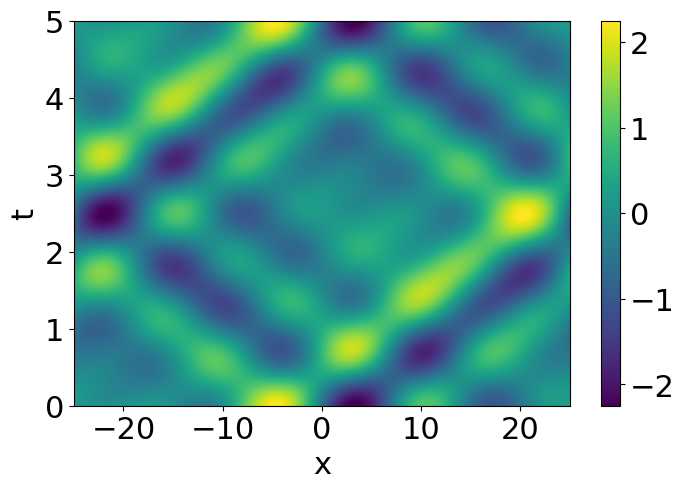

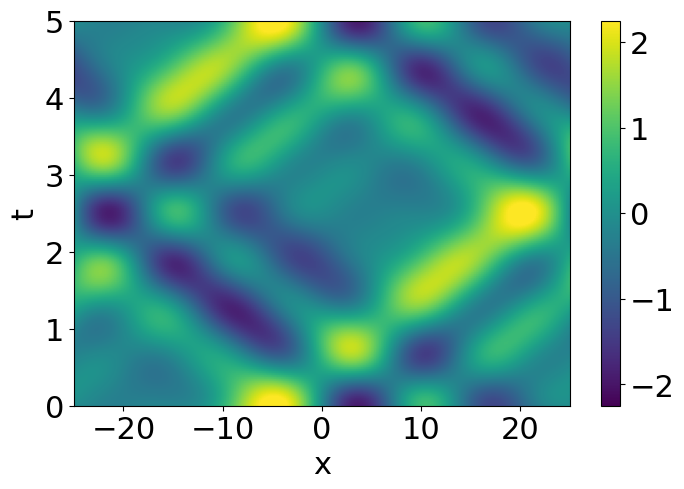

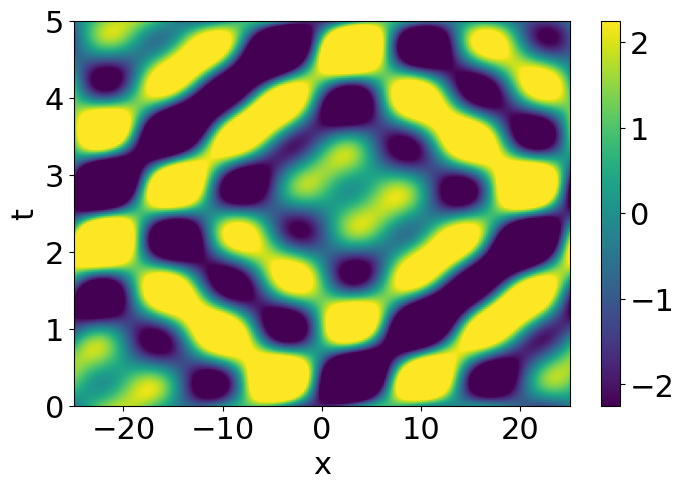

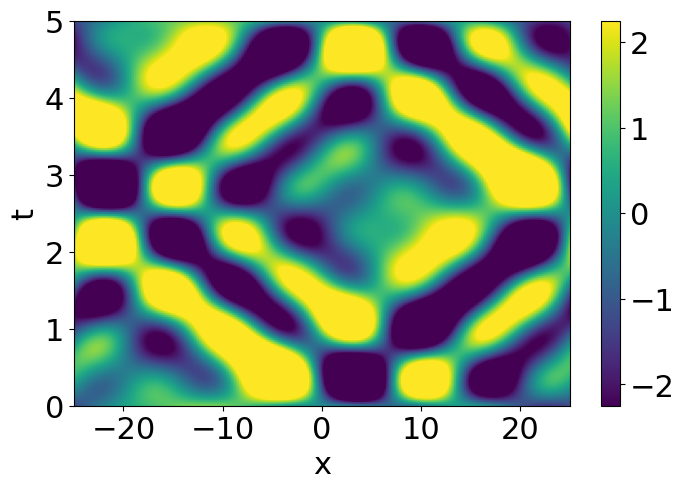

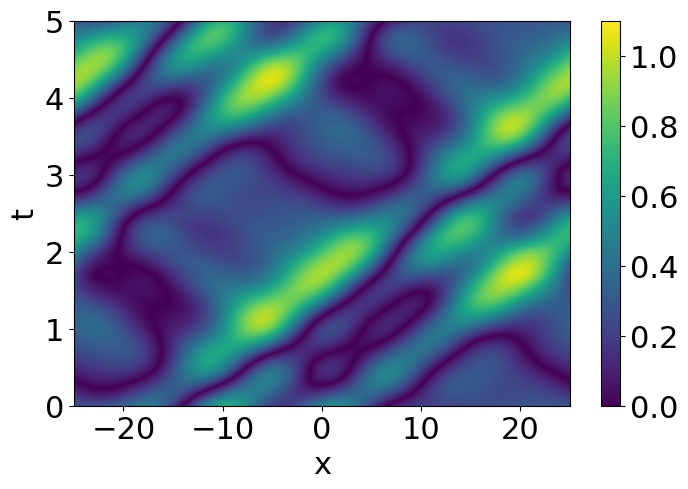

...

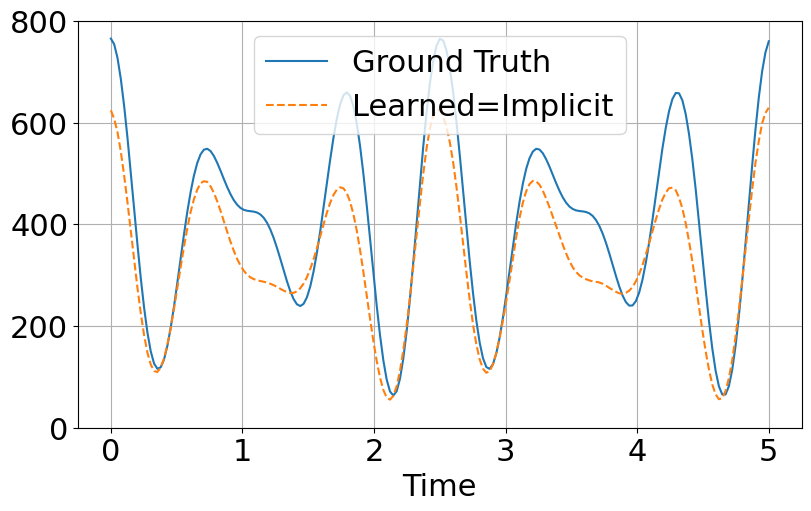

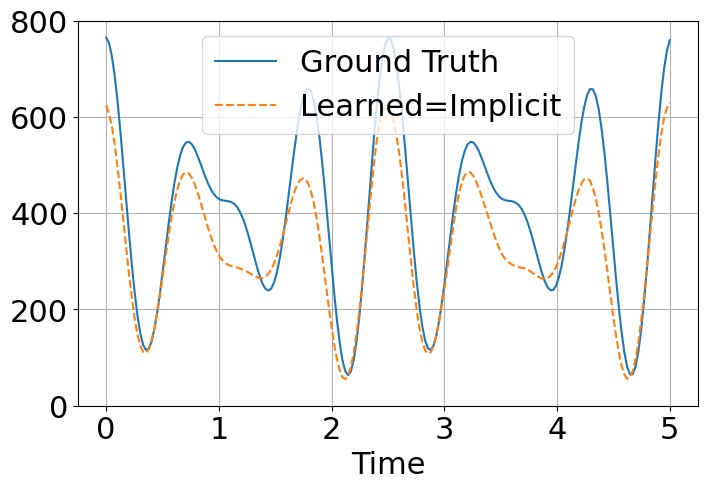

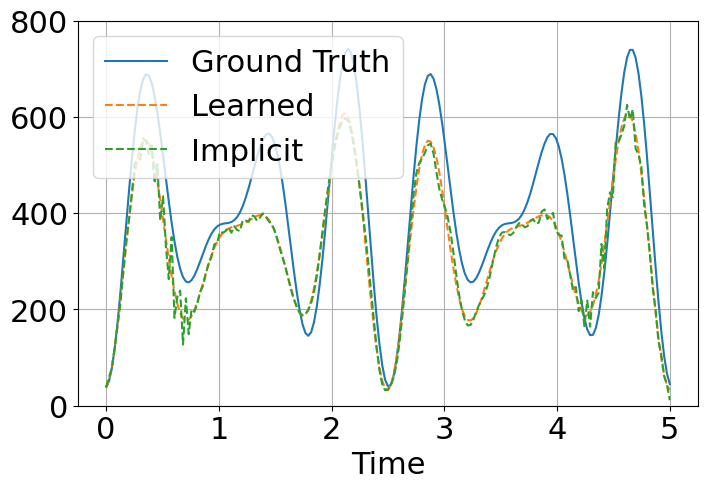

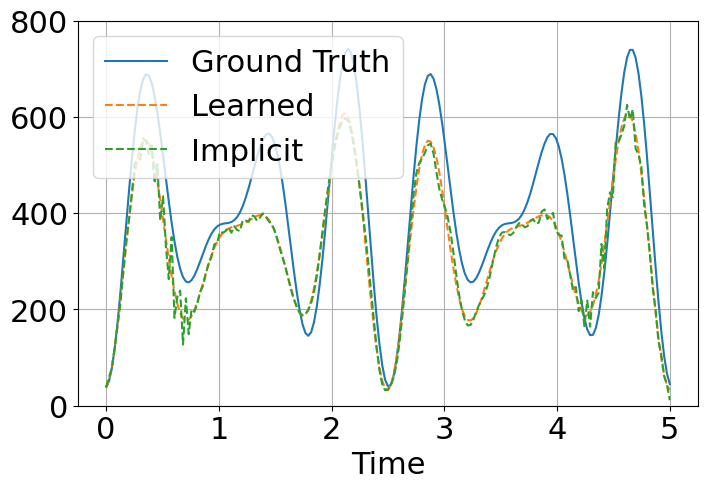

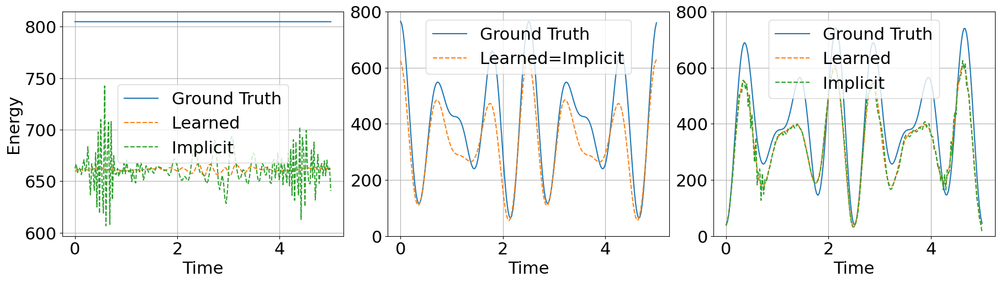

In [14]:


plot_1d_wave_evolution(data_path, save_dir, 0, exp_name, exp_label, title=False, x_label=True, y_label=True, colorbar=True, fontsize=22, v_min=DSO_v_min, v_max=DSO_v_max, diff_min=DSO_diff_min, diff_max=DSO_diff_max, nrg_ylim = DSO_nrg_ylim, make_legend=True)


**QR DSO**

In [15]:
data_path = '/Users/XXXX/oxford_code/structure_preserving_operator_learning/methods/deeponet/experiments/dos_1_3/exp_n_20250419-060358/plots/data_0__test.pkl'
exp_name = 'qr_dos'
exp_label = 'QR DSO'
save_dir = # add path here
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

In [16]:
exp_data = [(exp_label,['20250419-060358'])]
loss_types = {'mse_loss_train': 'training MSE', 'mse_loss_val': 'validation MSE'}

wandb_viz_loss_with_std(exp_data, norm_factor=199,legend_font=24, title=exp_label,  y_lim=[10 ** (-7),10 ** (3)], exclude=None, loss_types=loss_types, save_dir=save_dir, make_legend=False, x_label=False, y_label=True)
wandb_viz_loss_with_std(exp_data, norm_factor=199,legend_font=24, title=exp_label,  y_lim=[10 ** (-7),10 ** (3)], plot_std=False, exclude=None, loss_types=loss_types, save_dir=save_dir, make_legend=False, x_label=False, y_label=True)

In [17]:
#now select the eval run:

exp_data = [(exp_label,['20250420-202230'])]
data_path = '/Users/XXXX/oxford_code/structure_preserving_operator_learning/methods/deeponet/experiments/dos_1eval_3/exp_n_20250420-202230/plots/data_0__test.pkl'


In [18]:
loss_types = {'mse_loss_train': 'training MSE', 'mse_loss_val': 'validation MSE', 'current_energy_loss_val':'implicit energy MSE', 'learned_energy_loss_val':'learned energy MSE', 'mse_loss_test':'test MSE',  'current_energy_loss_test':'implicit energy MSE test', 'learned_energy_loss_test':'learned energy MSE test'}

wandb_final_loss_with_std(exp_data, exclude=None, loss_types=loss_types, save_dir=save_dir)

 Label                    training MSE                   validation MSE                implicit energy MSE              learned energy MSE                         test MSE           implicit energy MSE test         learned energy MSE test
QR DSO 0.010072766898 ± 0.000000000000 47.231443941593 ± 0.000000000000 6481.538719177246 ± 0.000000000000 0.000003088878 ± 0.000000000000 43.334767788649 ± 0.000000000000 5620.147377967834 ± 0.000000000000 0.000002839265 ± 0.000000000000


torch.Size([199, 1])


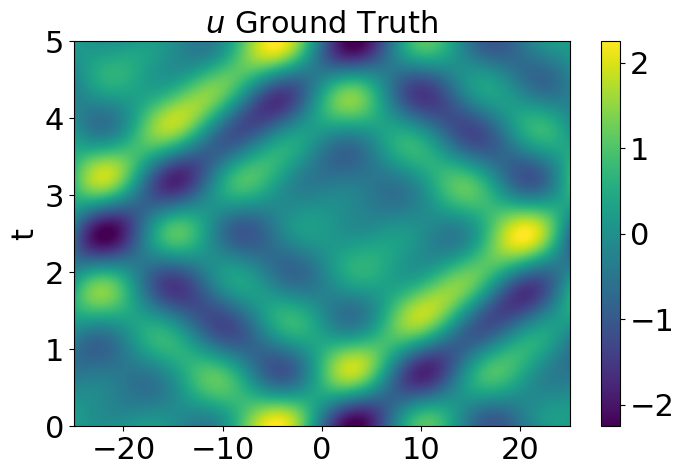

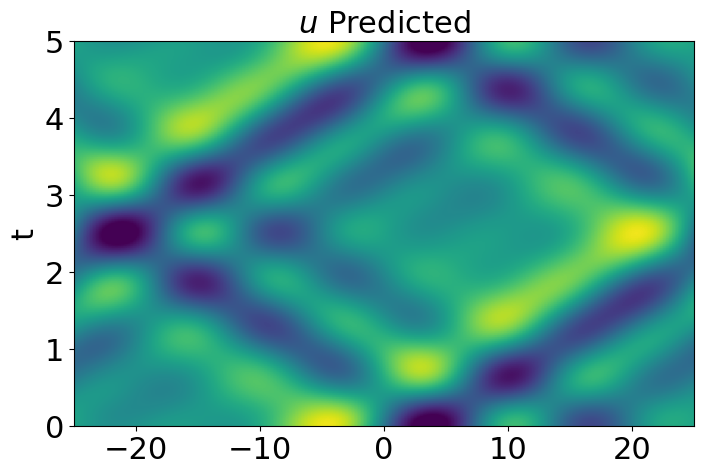

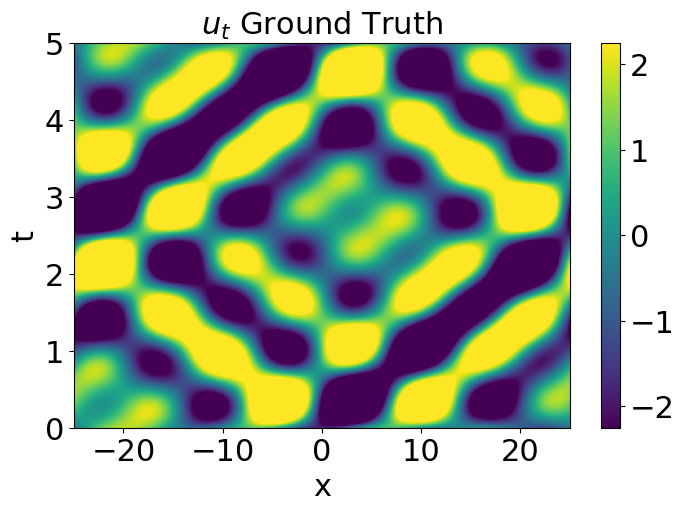

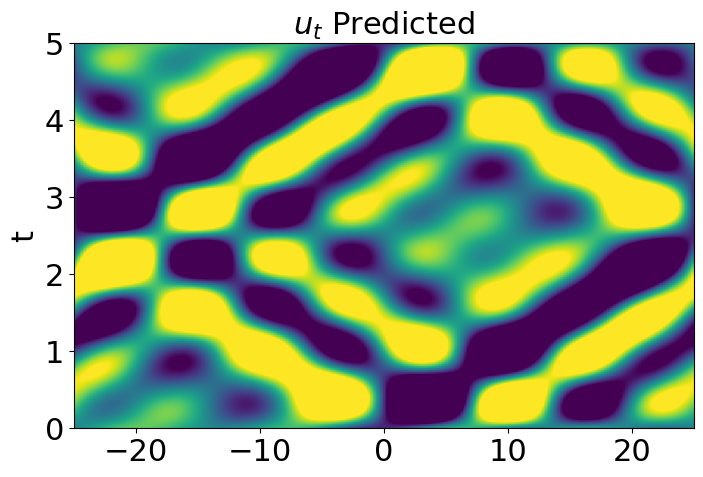

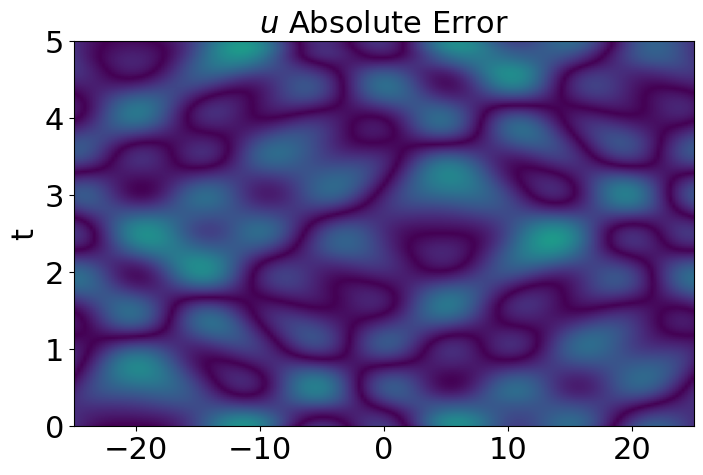

...

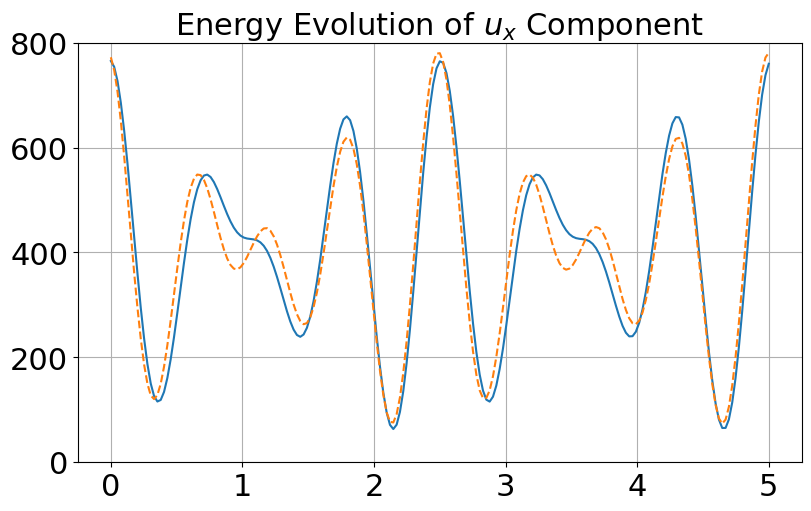

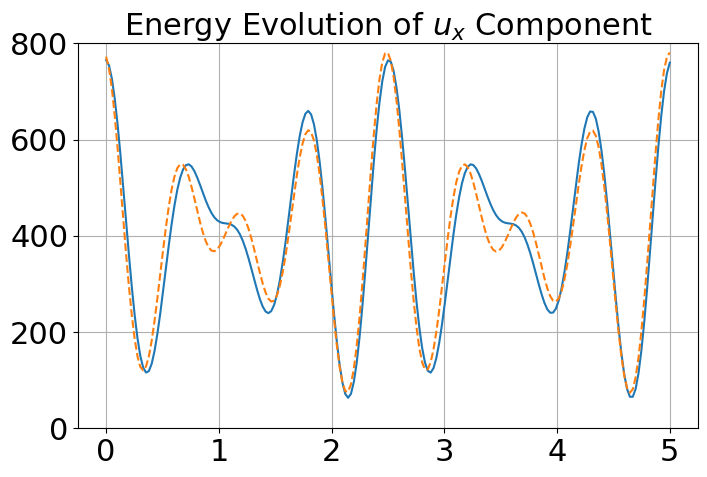

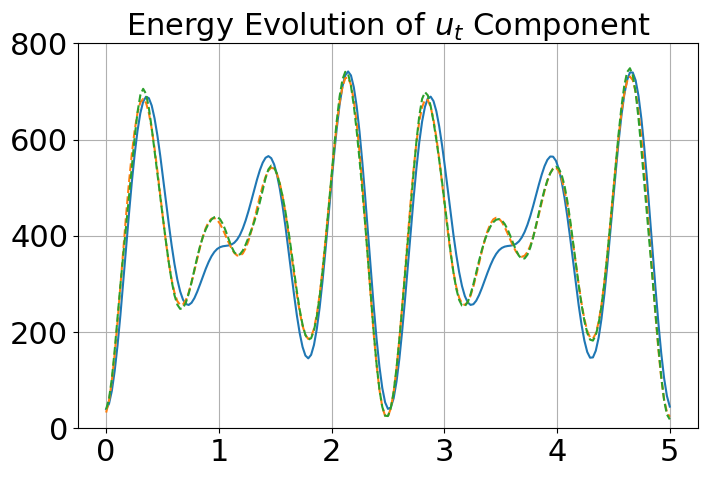

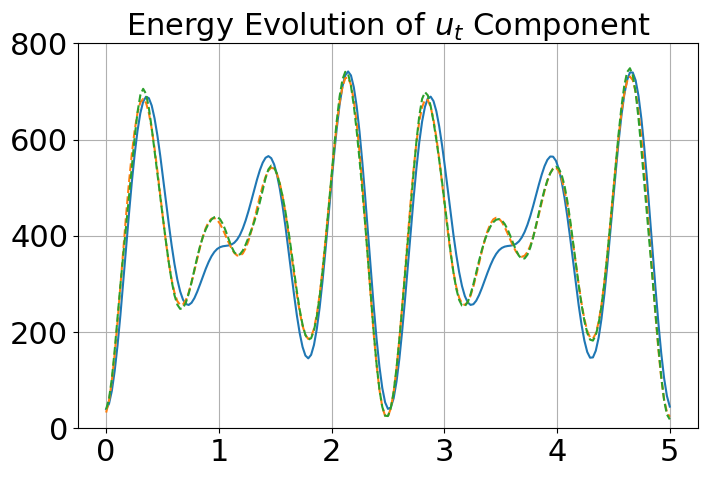

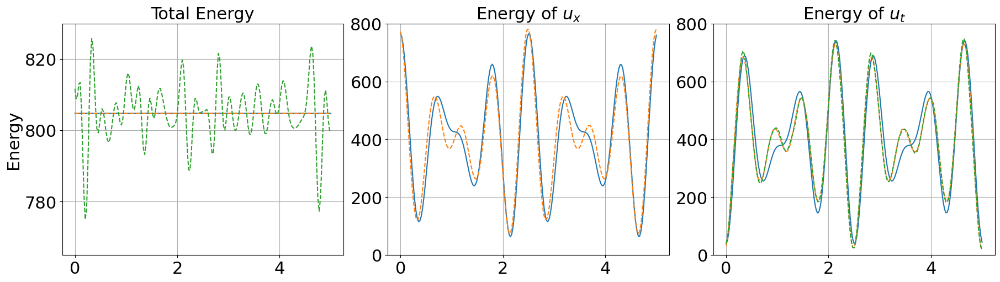

In [19]:


plot_1d_wave_evolution(data_path, save_dir, 0, exp_name, exp_label, title=True, x_label=False, y_label=True, fontsize=22, v_min=DSO_v_min, v_max=DSO_v_max, diff_min=DSO_diff_min, diff_max=DSO_diff_max, colorbar=False, total_nrg_ylim = DSO_total_nrg_ylim, nrg_ylim = DSO_nrg_ylim, make_legend=False)


**Norm DSO**

In [20]:
data_path = '/Users/XXXX/oxford_code/structure_preserving_operator_learning/methods/deeponet/experiments/dos_1_2/exp_n_20250419-030258/plots/data_0__test.pkl'
exp_name = 'norm_dos'
exp_label = 'Normalized DSO'
save_dir = # add path here
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

In [21]:
exp_data = [(exp_label,['20250419-030258'])]
loss_types = {'mse_loss_train': 'training MSE', 'mse_loss_val': 'validation MSE'}

wandb_viz_loss_with_std(exp_data, norm_factor=199,legend_font=24, title=exp_label,  y_lim=[10 ** (-7),10 ** (3)], exclude=None, loss_types=loss_types, save_dir=save_dir, make_legend=False, x_label=False, y_label=False)
wandb_viz_loss_with_std(exp_data, norm_factor=199,legend_font=24, title=exp_label,  y_lim=[10 ** (-7),10 ** (3)], plot_std=False, exclude=None, loss_types=loss_types, save_dir=save_dir, make_legend=False, x_label=False, y_label=False)

In [22]:
#now select the eval run:

exp_data = [(exp_label,['20250420-195601'])]
data_path = '/Users/XXXX/oxford_code/structure_preserving_operator_learning/methods/deeponet/experiments/dos_1eval_2/exp_n_20250420-195601/plots/data_0__test.pkl'


In [23]:
loss_types = {'mse_loss_train': 'training MSE', 'mse_loss_val': 'validation MSE', 'current_energy_loss_val':'implicit energy MSE', 'learned_energy_loss_val':'learned energy MSE', 'mse_loss_test':'test MSE',  'current_energy_loss_test':'implicit energy MSE test', 'learned_energy_loss_test':'learned energy MSE test'}

wandb_final_loss_with_std(exp_data, exclude=None, loss_types=loss_types, save_dir=save_dir)

         Label                    training MSE                   validation MSE                implicit energy MSE              learned energy MSE                         test MSE           implicit energy MSE test         learned energy MSE test
Normalized DSO 0.037982809095 ± 0.000000000000 42.136227265000 ± 0.000000000000 5468.857029914856 ± 0.000000000000 0.000000576756 ± 0.000000000000 40.974959537387 ± 0.000000000000 4875.738767623901 ± 0.000000000000 0.000000508389 ± 0.000000000000


torch.Size([199, 1])


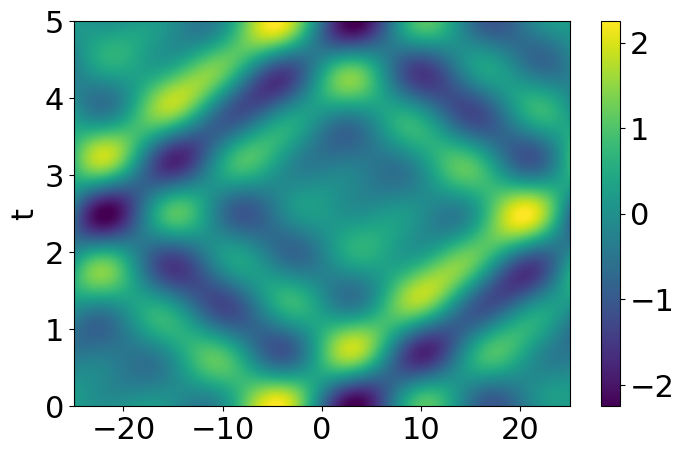

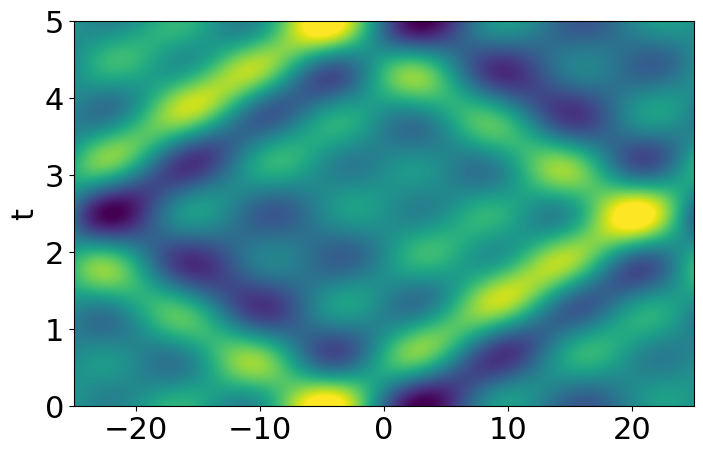

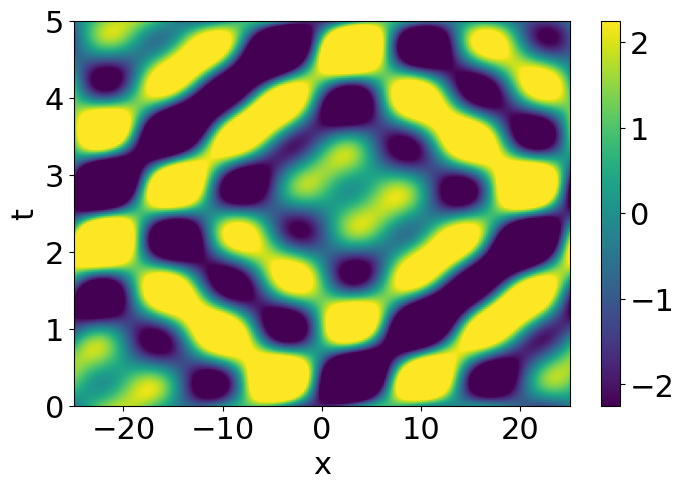

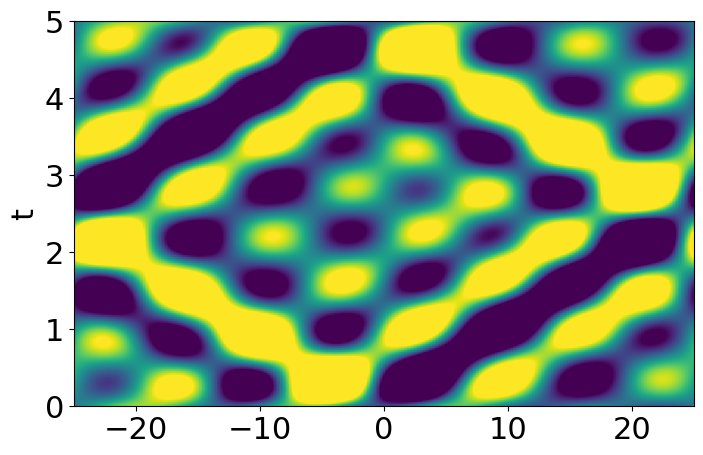

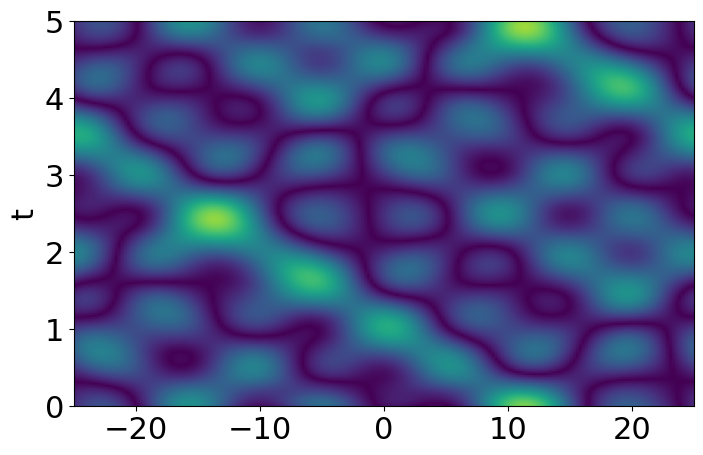

...

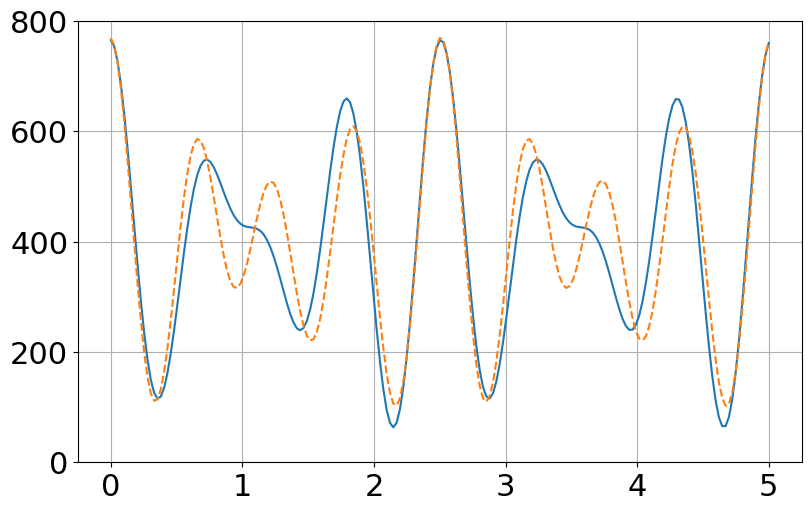

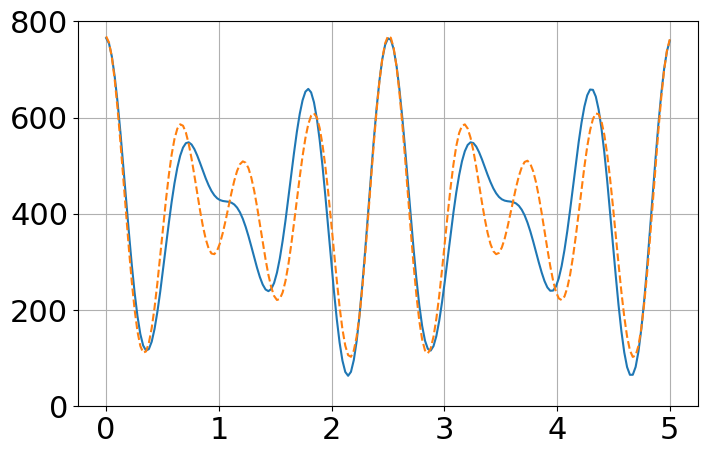

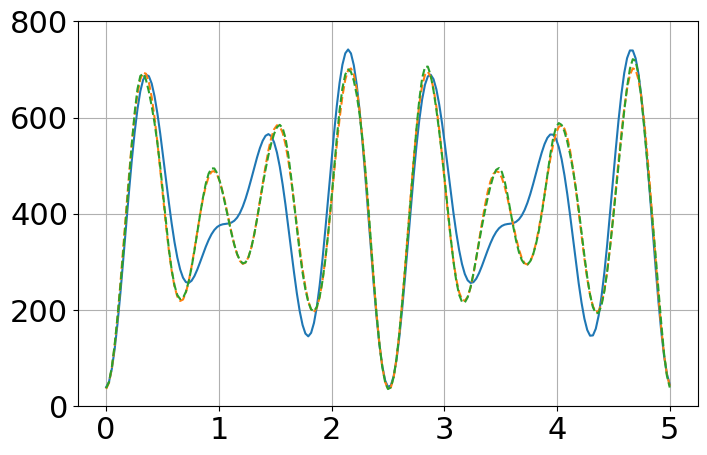

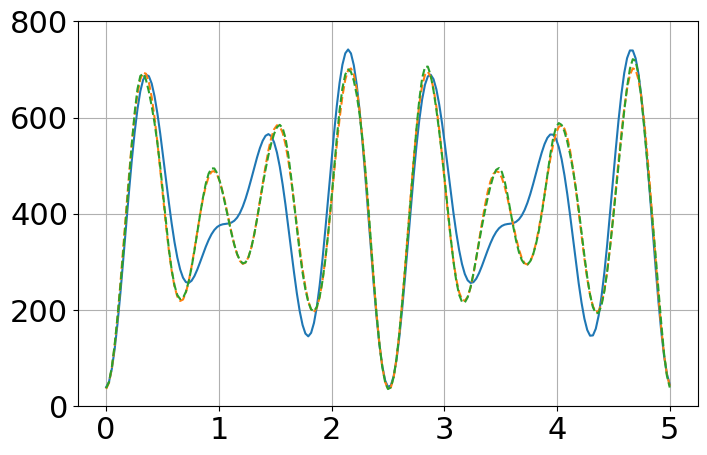

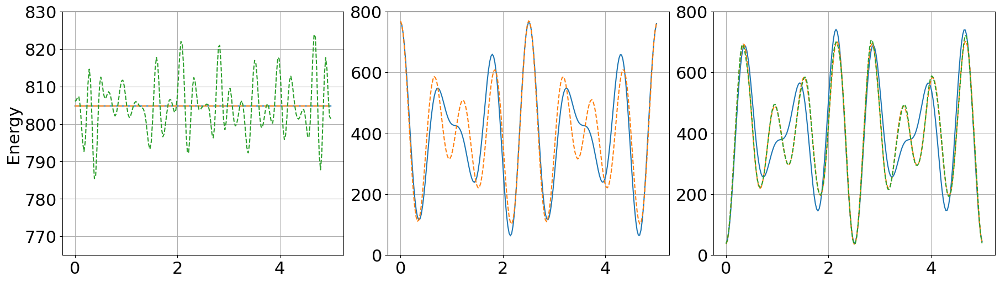

In [24]:


plot_1d_wave_evolution(data_path, save_dir, 0, exp_name, exp_label, title=False, x_label=False, y_label=True, fontsize=22, v_min=DSO_v_min, v_max=DSO_v_max, diff_min=DSO_diff_min, diff_max=DSO_diff_max, colorbar=False, total_nrg_ylim = DSO_total_nrg_ylim, nrg_ylim = DSO_nrg_ylim, make_legend=False)


**Implicit Norm DSO**

In [25]:
data_path = '/Users/XXXX/oxford_code/structure_preserving_operator_learning/methods/deeponet/experiments/dos_1_4/exp_n_20250420-185647/plots/data_0__test.pkl'
exp_name = 'implicit_dos'
exp_label = 'Implicitly Normalized DSO'
save_dir = # add path here
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

In [26]:
exp_data = [(exp_label,['20250420-185647'])]
loss_types = {'mse_loss_train': 'training MSE', 'mse_loss_val': 'validation MSE'}

wandb_viz_loss_with_std(exp_data, norm_factor=199,legend_font=24, title=exp_label,  y_lim=[10 ** (-7),10 ** (3)], exclude=None, loss_types=loss_types, save_dir=save_dir, make_legend=False, x_label=False, y_label=False)
wandb_viz_loss_with_std(exp_data, norm_factor=199,legend_font=24, title=exp_label,  y_lim=[10 ** (-7),10 ** (3)], plot_std=False, exclude=None, loss_types=loss_types, save_dir=save_dir, make_legend=False, x_label=False, y_label=False)

In [27]:
loss_types = {'mse_loss_train': 'training MSE', 'mse_loss_val': 'validation MSE', 'current_energy_loss_val':'implicit energy MSE', 'learned_energy_loss_val':'learned energy MSE', 'mse_loss_test':'test MSE',  'current_energy_loss_test':'implicit energy MSE test', 'learned_energy_loss_test':'learned energy MSE test'}

wandb_final_loss_with_std(exp_data, exclude=None, loss_types=loss_types, save_dir=save_dir)

                    Label                    training MSE                   validation MSE                implicit energy MSE                 learned energy MSE                         test MSE           implicit energy MSE test            learned energy MSE test
Implicitly Normalized DSO 0.066410078260 ± 0.000000000000 62.310431391001 ± 0.000000000000 2971.728127956390 ± 0.000000000000 2703.518278121948 ± 0.000000000000 59.512722462416 ± 0.000000000000 2498.542840480804 ± 0.000000000000 2276.389473915100 ± 0.000000000000


torch.Size([199, 1])


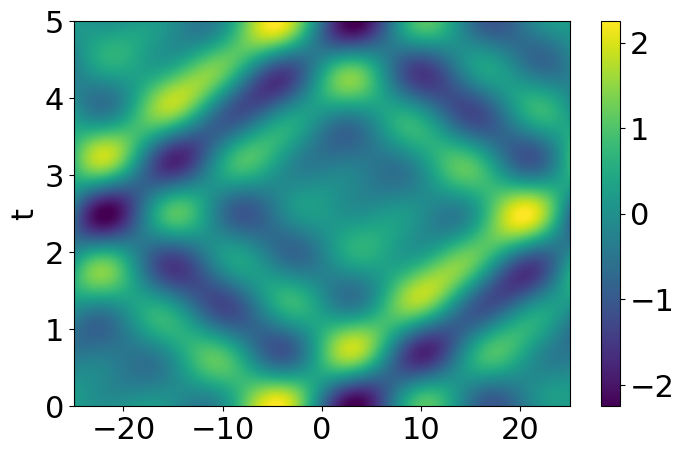

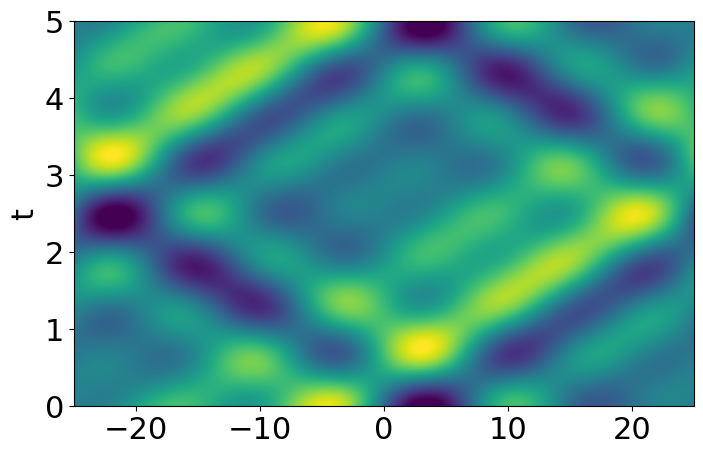

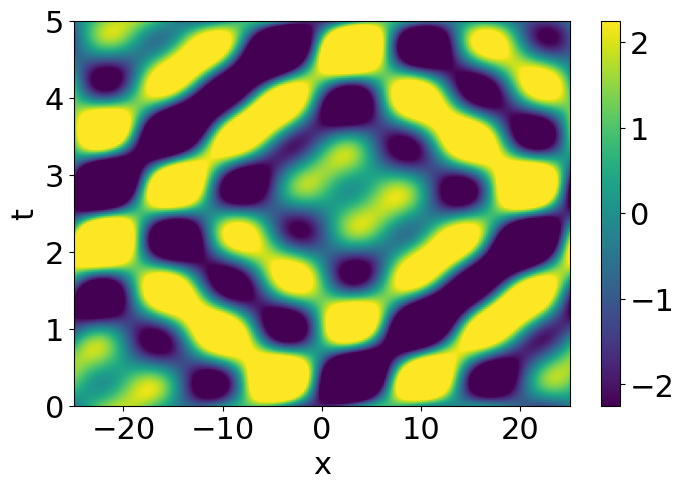

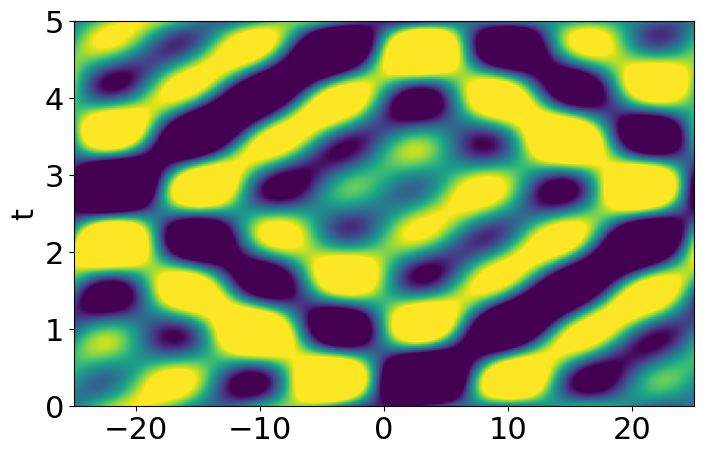

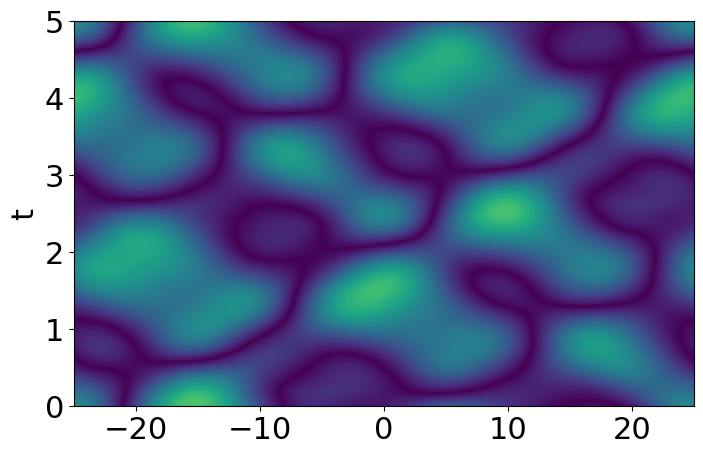

...

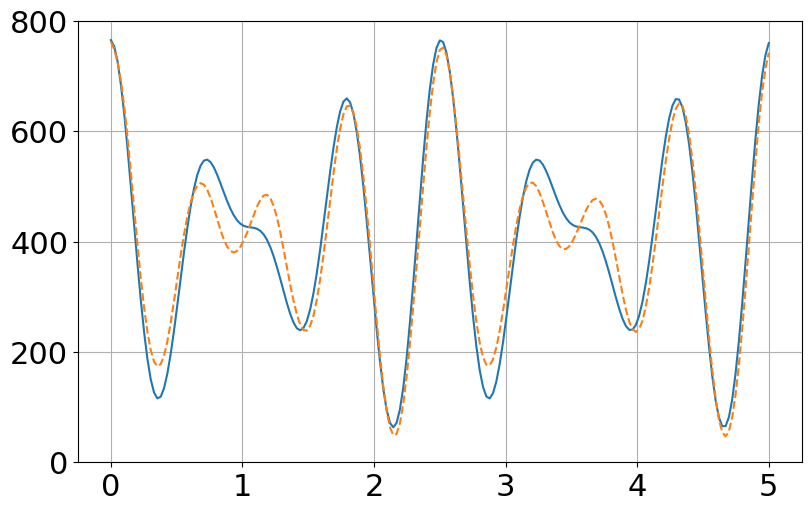

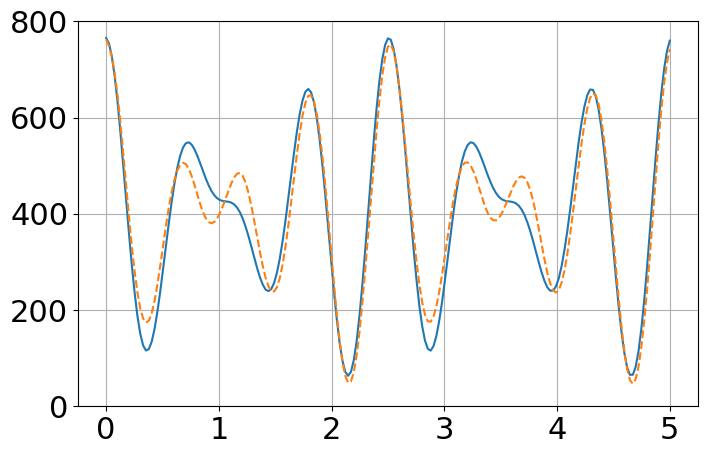

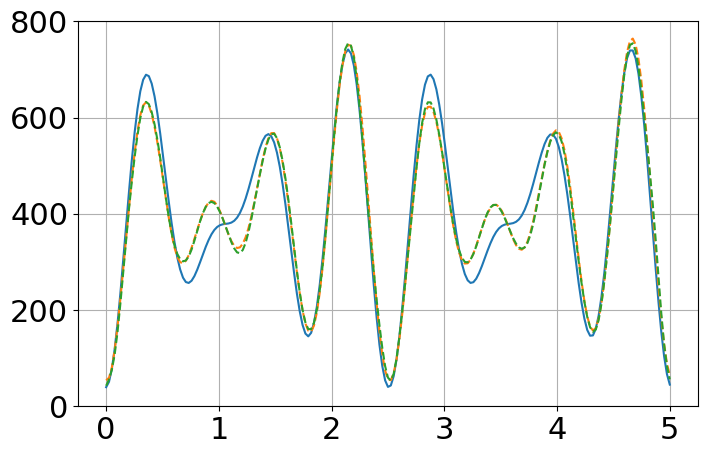

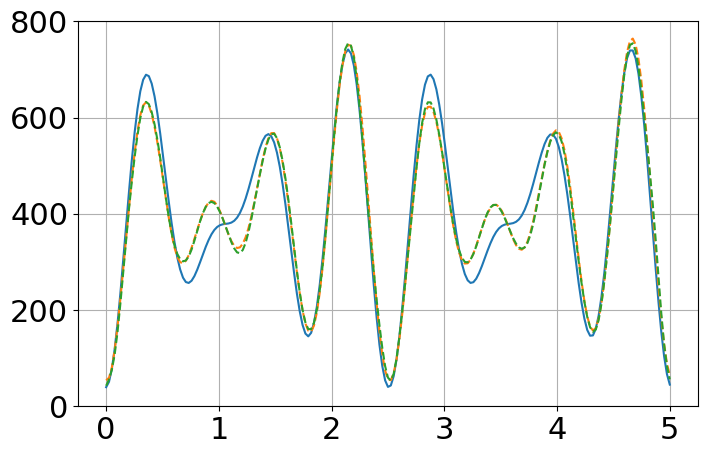

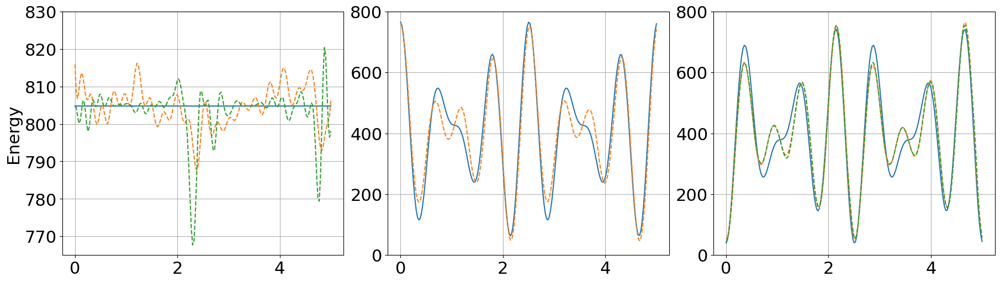

In [28]:

plot_1d_wave_evolution(data_path, save_dir, 0, exp_name, exp_label, title=False, x_label=False, y_label=True, fontsize=22, v_min=DSO_v_min, v_max=DSO_v_max, diff_min=DSO_diff_min, diff_max=DSO_diff_max, colorbar=False, total_nrg_ylim = DSO_total_nrg_ylim, nrg_ylim = DSO_nrg_ylim, make_legend=False)


In [11]:
AFNO_v_min = DSO_v_min
AFNO_v_max = DSO_v_max
AFNO_diff_min = DSO_diff_min
AFNO_diff_max = DSO_diff_max


AFNO_total_nrg_ylim=DSO_total_nrg_ylim
AFNO_nrg_ylim=DSO_nrg_ylim

**Vanilla AFNO**

In [17]:
data_path = '/Users/XXXX/oxford_code/structure_preserving_operator_learning/methods/full_fourier/experiments/afno_1b_2/exp_n_20250427-185035/plots/data_0__test.pkl'
exp_name = 'vanilla_afno'
exp_label = 'Vanilla AFNO'
save_dir = # add path here
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

In [18]:
exp_data = [(exp_label,['20250427-185035'])]
loss_types = {'mse_loss_train': 'training MSE', 'mse_loss_val': 'validation MSE'}

wandb_viz_loss_with_std(exp_data, legend_font=24, title=exp_label,  y_lim=[10 ** (-7),10 ** (3)], exclude=None, loss_types=loss_types, save_dir=save_dir, make_legend=True, x_label=True, y_label=False)
wandb_viz_loss_with_std(exp_data, legend_font=24, title=exp_label,  y_lim=[10 ** (-7),10 ** (3)], plot_std=False, exclude=None, loss_types=loss_types, save_dir=save_dir, make_legend=True, x_label=True, y_label=False)

In [19]:
loss_types = {'current_energy_loss_val':'Vanilla DeepONet Energy - implicit energy MSE'}

wandb_viz_loss_with_std(exp_data, style_by_loss_type=True, legend_font=18,figsize=(12, 6), color_by_loss_type=True, plot_name='energy vanilla',plot_std=False, exclude=None, loss_types=loss_types, save_dir=save_dir, make_legend=True)

In [20]:
loss_types = {'mse_loss_train': 'training MSE', 'mse_loss_val': 'validation MSE', 'current_energy_loss_val':'implicit energy MSE', 'learned_energy_loss_val':'learned energy MSE', 'mse_loss_test':'test MSE',  'current_energy_loss_test':'implicit energy MSE test', 'learned_energy_loss_test':'learned energy MSE test'}

wandb_final_loss_with_std(exp_data, exclude=None, loss_types=loss_types, save_dir=save_dir)

Skipping run 20250427-185035 due to error: 'learned_energy_loss_val'
Skipping run 20250427-185035 due to error: 'learned_energy_loss_test'
       Label                    training MSE                  validation MSE                implicit energy MSE learned energy MSE                        test MSE           implicit energy MSE test learned energy MSE test
Vanilla AFNO 0.000061468148 ± 0.000000000000 0.000068807880 ± 0.000000000000 2216.158447265625 ± 0.000000000000                N/A 0.000069404581 ± 0.000000000000 2274.808349609375 ± 0.000000000000                     N/A


/var/folders/9z/g5qd8cf95dg743cjhmdb6zsw0000gn/T/ipykernel_15759/1231713106.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(data.get('x')) if data.get('x') is not None else None


torch.Size([199])


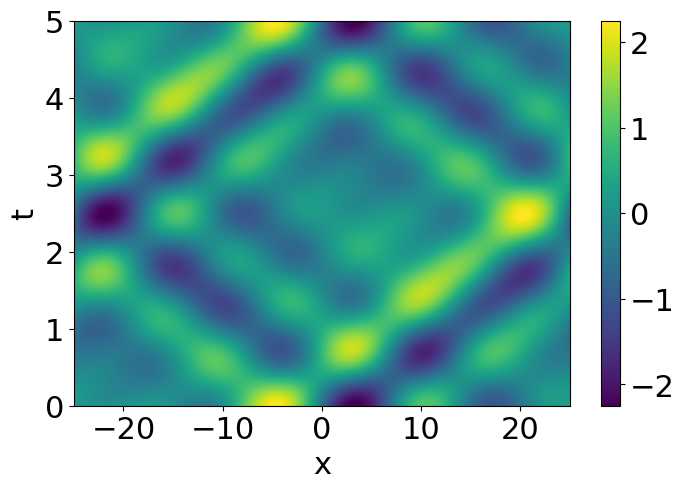

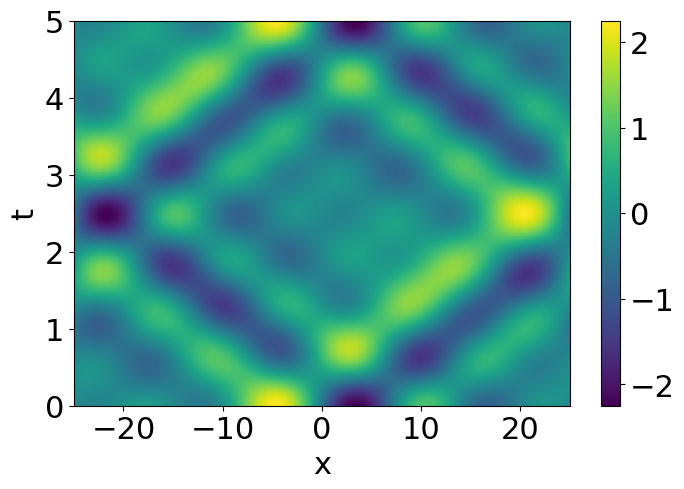

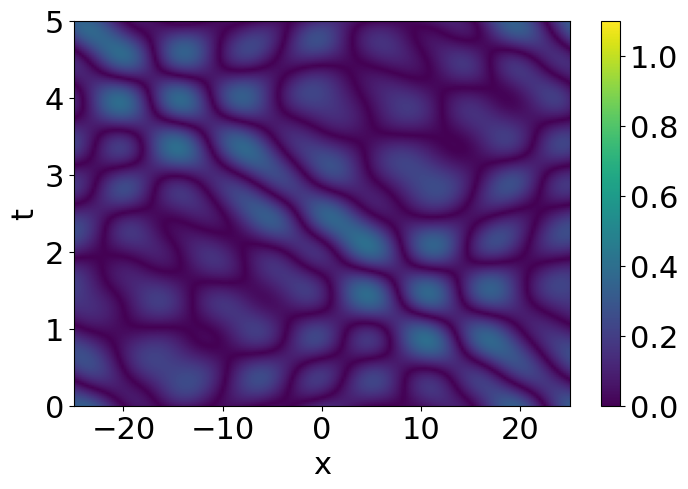

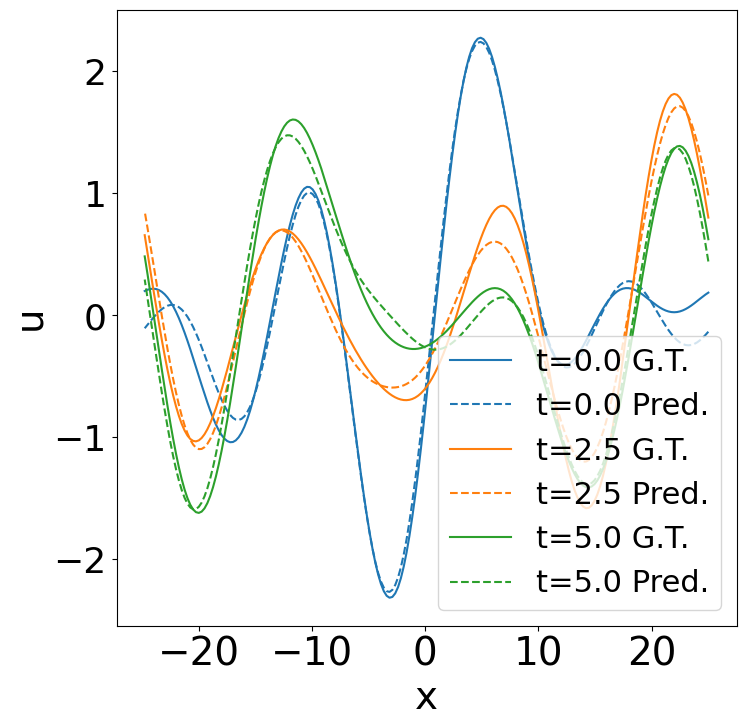

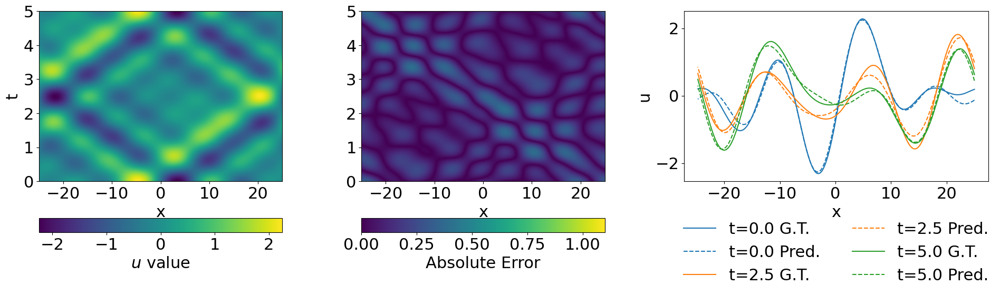

...

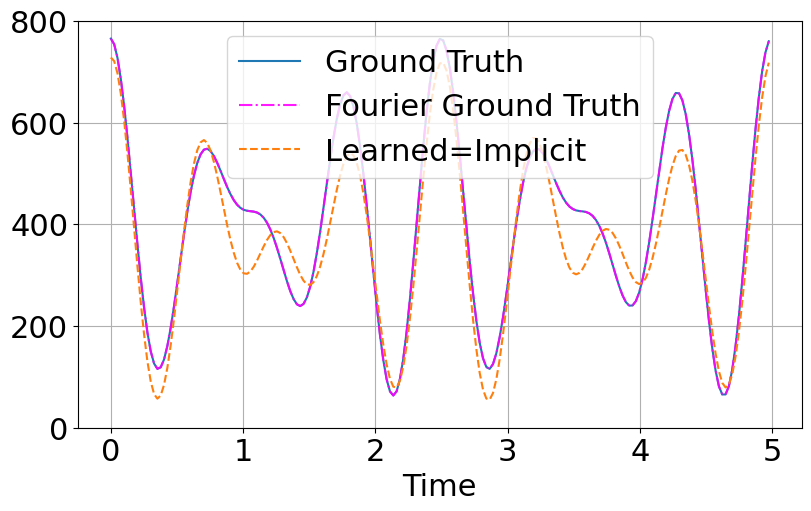

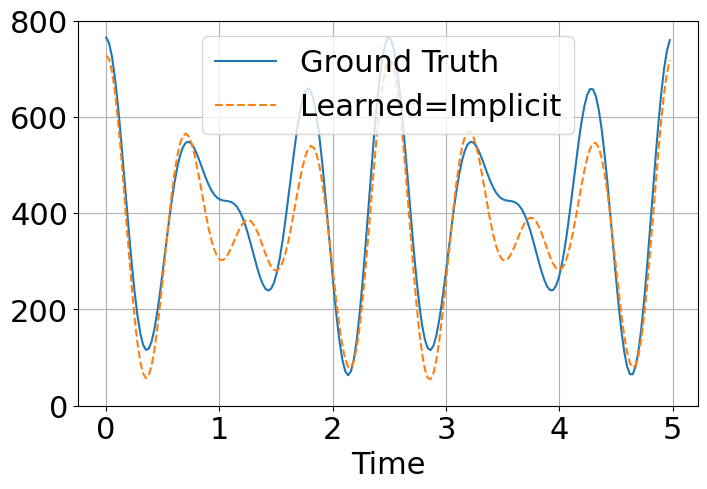

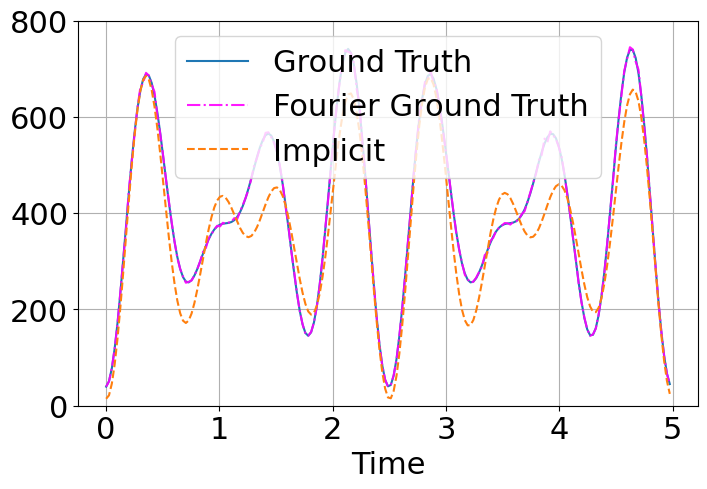

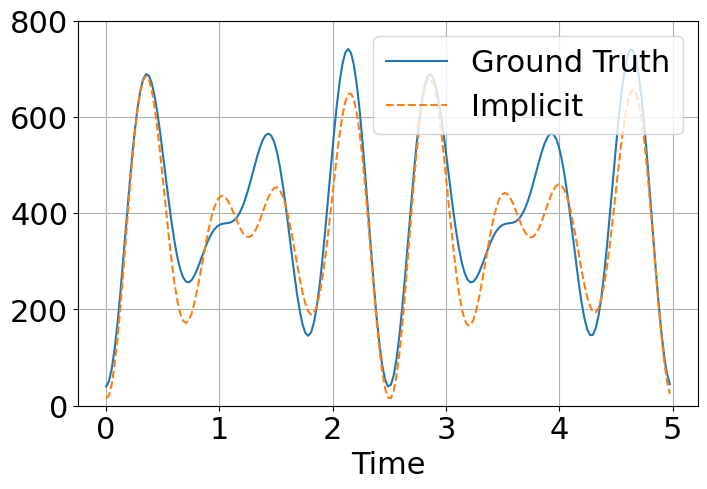

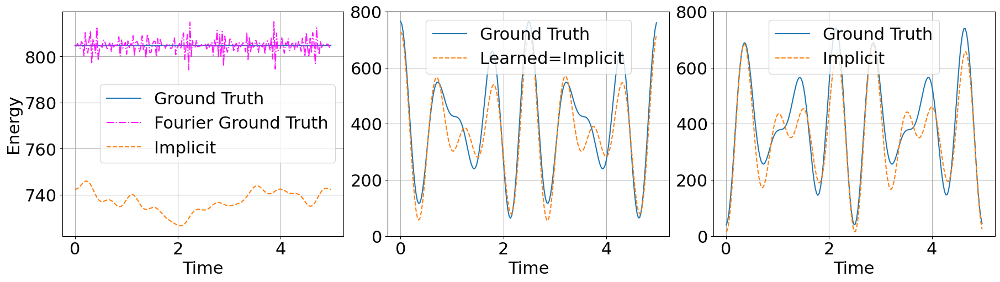

In [21]:

plot_1d_wave_evolution(data_path, save_dir, 0, exp_name, exp_label, factor=1, title=False, x_label=True, y_label=True, fontsize=22, v_min=AFNO_v_min, v_max=AFNO_v_max, diff_min=AFNO_diff_min, diff_max=AFNO_diff_max, colorbar=True, nrg_ylim = AFNO_nrg_ylim, make_legend=True)


**Norm AFNO**

In [36]:
data_path = '/Users/XXXX/oxford_code/structure_preserving_operator_learning/methods/full_fourier/experiments/afno_1_2/exp_n_20250418-191509/plots/data_0__test.pkl'
exp_name = 'norm_afno'
exp_label = 'Normalized AFNO'
save_dir = # add path here
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

In [37]:
exp_data = [(exp_label,['20250418-191509'])]
loss_types = {'mse_loss_train': 'training MSE', 'mse_loss_val': 'validation MSE'}

wandb_viz_loss_with_std(exp_data, legend_font=24, title=exp_label,  y_lim=[10 ** (-7),10 ** (3)], exclude=None, loss_types=loss_types, save_dir=save_dir, make_legend=False, x_label=True, y_label=False)
wandb_viz_loss_with_std(exp_data, legend_font=24, title=exp_label,  y_lim=[10 ** (-7),10 ** (3)], plot_std=False, exclude=None, loss_types=loss_types, save_dir=save_dir, make_legend=False, x_label=True,y_label=False)

In [38]:
loss_types = {'mse_loss_train': 'training MSE', 'mse_loss_val': 'validation MSE', 'current_energy_loss_val':'implicit energy MSE', 'learned_energy_loss_val':'learned energy MSE', 'mse_loss_test':'test MSE',  'current_energy_loss_test':'implicit energy MSE test', 'learned_energy_loss_test':'learned energy MSE test'}

wandb_final_loss_with_std(exp_data, exclude=None, loss_types=loss_types, save_dir=save_dir)

Skipping run 20250418-191509 due to error: 'learned_energy_loss_val'
Skipping run 20250418-191509 due to error: 'learned_energy_loss_test'
          Label                    training MSE                  validation MSE             implicit energy MSE learned energy MSE                        test MSE        implicit energy MSE test learned energy MSE test
Normalized AFNO 0.000000127094 ± 0.000000000000 0.000000422764 ± 0.000000000000 1.844962596893 ± 0.000000000000                N/A 0.000000395135 ± 0.000000000000 1.551465034485 ± 0.000000000000                     N/A


/var/folders/9z/g5qd8cf95dg743cjhmdb6zsw0000gn/T/ipykernel_25134/1231713106.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(data.get('x')) if data.get('x') is not None else None


torch.Size([199])


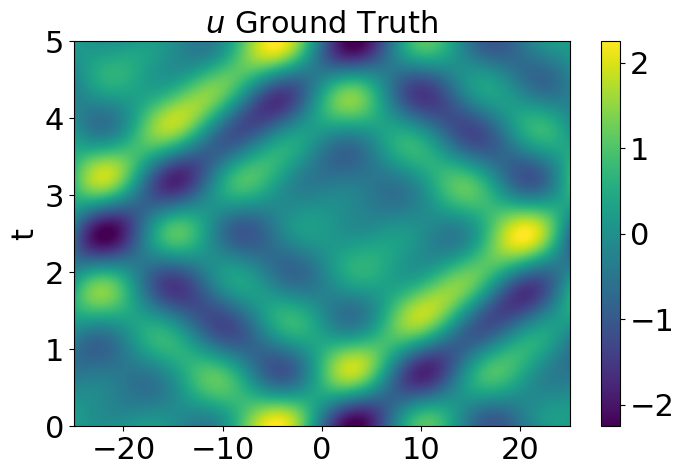

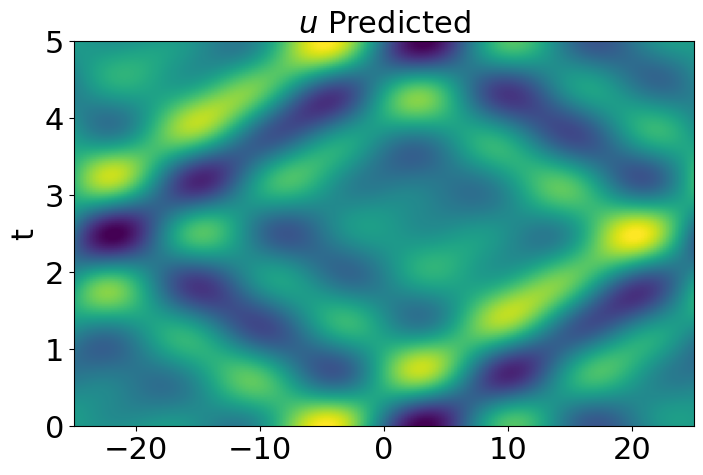

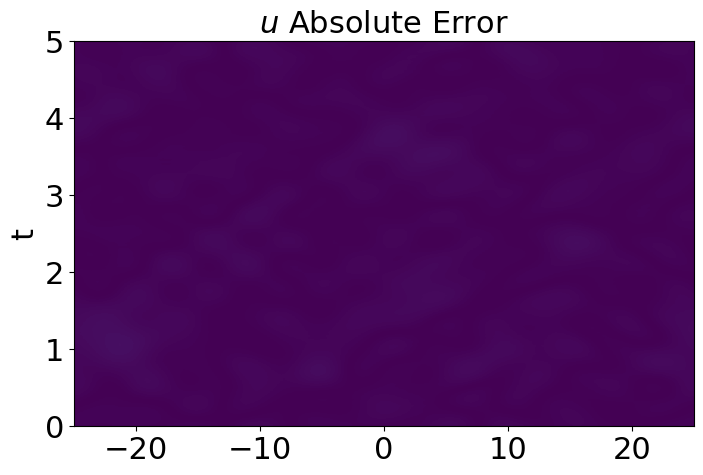

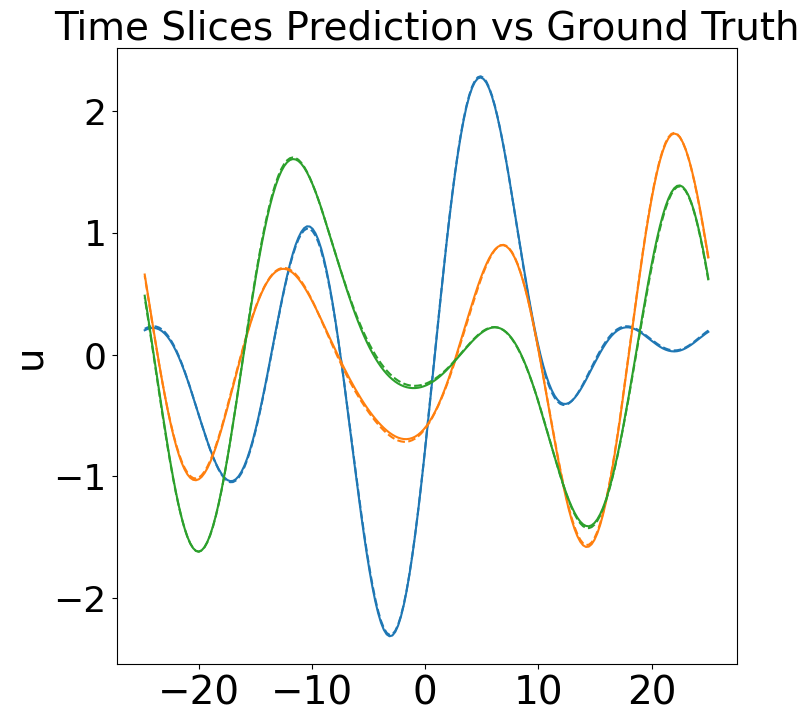

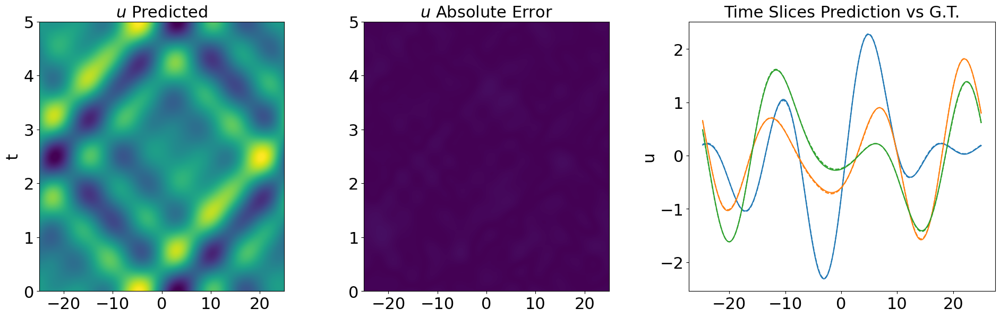

...

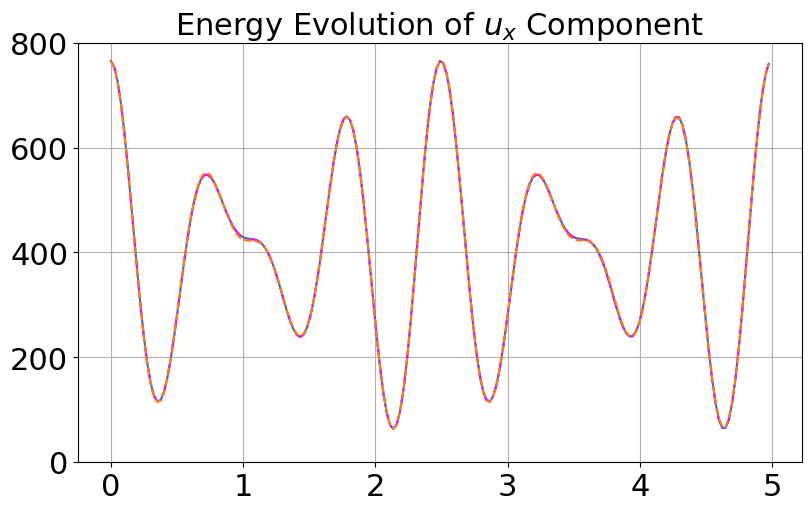

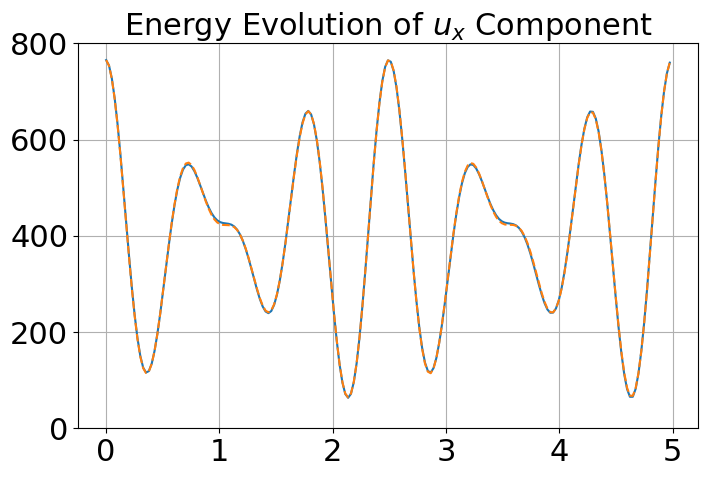

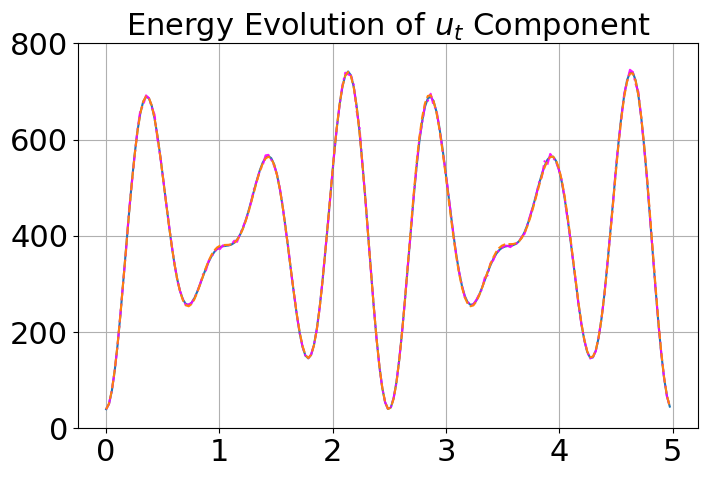

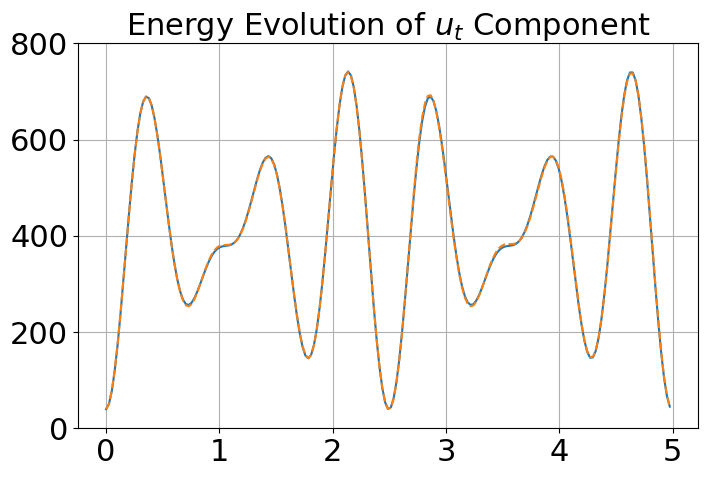

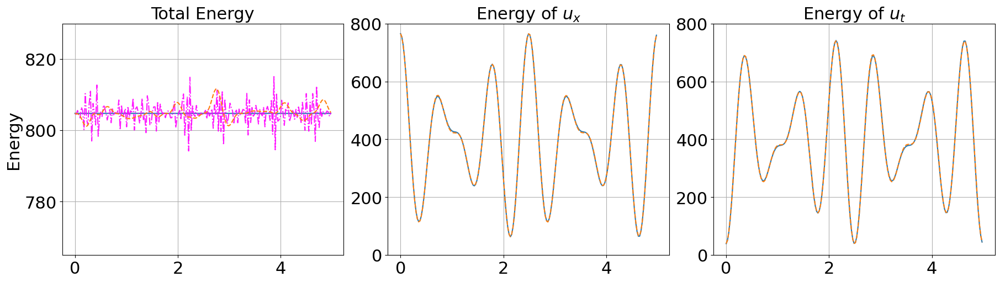

In [39]:


plot_1d_wave_evolution(data_path, save_dir, 0, exp_name, exp_label, factor=1, title=True, x_label=False, y_label=True, fontsize=22, v_min=AFNO_v_min, v_max=AFNO_v_max, diff_min=AFNO_diff_min, diff_max=AFNO_diff_max, colorbar=False, total_nrg_ylim = AFNO_total_nrg_ylim, nrg_ylim = AFNO_nrg_ylim, make_legend=False)
